
Herlev – Fine-tuned ResNet-50
Number of epochs: 20
Columns:
['epoch', 'train_loss', 'train_accuracy', 'train_macro_f1', 'validation_loss', 'validation_accuracy', 'validation_macro_f1', 'learning_rate', 'epoch_time_seconds']

Herlev – RCGAN + ResNet-50
Number of epochs: 20
Columns:
['epoch', 'train_loss', 'train_accuracy', 'train_macro_f1', 'validation_loss', 'validation_accuracy', 'validation_macro_f1', 'learning_rate', 'epoch_time_seconds']

SIPaKMeD – Fine-tuned ResNet-50
Number of epochs: 20
Columns:
['epoch', 'train_loss', 'train_accuracy', 'train_macro_f1', 'validation_loss', 'validation_accuracy', 'validation_macro_f1', 'learning_rate', 'epoch_time_seconds']

SIPaKMeD – RCGAN + ResNet-50
Number of epochs: 12
Columns:
['epoch', 'train_loss', 'train_accuracy', 'train_macro_f1', 'validation_loss', 'validation_accuracy', 'validation_macro_f1', 'learning_rate', 'epoch_time_seconds']


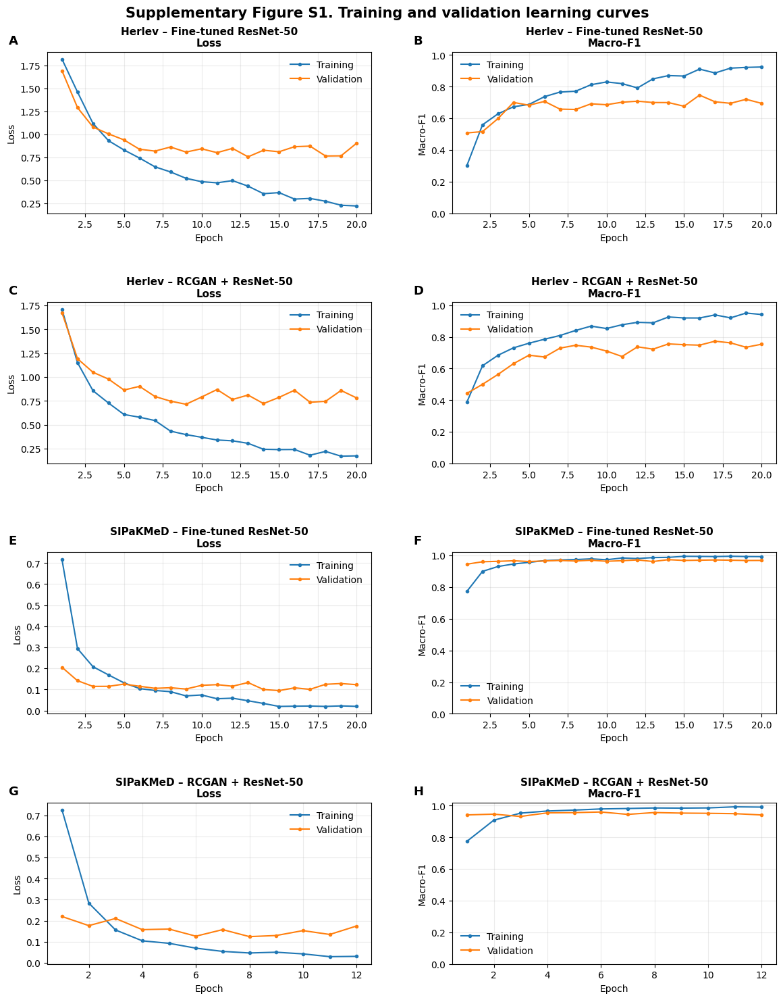


SUPPLEMENTARY FIGURE S1 CREATED
PNG:
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S1_Training_Curves.png

TIFF:
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S1_Training_Curves.tif


In [ ]:
# ============================================================
# SUPPLEMENTARY FIGURE S1
# TRAINING AND VALIDATION LEARNING CURVES
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ------------------------------------------------------------
# 1. PATHS TO THE FOUR HISTORY CSV FILES
# ------------------------------------------------------------

history_files = {
    "Herlev – Fine-tuned ResNet-50":
        "/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_ResNet50_FineTuned/History/resnet50_finetuned_history.csv",

    "Herlev – RCGAN + ResNet-50":
        "/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_RCGAN_ResNet50/History/resnet50_rcgan_history.csv",

    "SIPaKMeD – Fine-tuned ResNet-50":
        "/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_ResNet50_FineTuned/History/resnet50_sipakmed_history.csv",

    "SIPaKMeD – RCGAN + ResNet-50":
        "/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_ResNet50/History/resnet50_rcgan_history.csv"
}


# ------------------------------------------------------------
# 2. LOAD THE FOUR CSV FILES
# ------------------------------------------------------------

histories = {}

for name, path in history_files.items():

    df = pd.read_csv(path)

    histories[name] = df

    print(f"\n{name}")
    print("Number of epochs:", len(df))
    print("Columns:")
    print(df.columns.tolist())


# ------------------------------------------------------------
# 3. CREATE 4 × 2 PANEL FIGURE
# ------------------------------------------------------------

fig, axes = plt.subplots(
    nrows=4,
    ncols=2,
    figsize=(12, 15)
)

panel_labels = ["A", "B", "C", "D", "E", "F", "G", "H"]


# ------------------------------------------------------------
# 4. PLOT EACH MODEL
# ------------------------------------------------------------

for row, (model_name, df) in enumerate(histories.items()):

    epochs = df["epoch"]

    # ========================================================
    # LEFT COLUMN — LOSS
    # ========================================================

    ax = axes[row, 0]

    ax.plot(
        epochs,
        df["train_loss"],
        marker="o",
        markersize=3,
        linewidth=1.5,
        label="Training"
    )

    ax.plot(
        epochs,
        df["validation_loss"],
        marker="o",
        markersize=3,
        linewidth=1.5,
        label="Validation"
    )

    ax.set_title(
        f"{model_name}\nLoss",
        fontsize=11,
        fontweight="bold"
    )

    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")

    ax.grid(
        True,
        alpha=0.25
    )

    ax.legend(
        frameon=False
    )

    # Panel label
    ax.text(
        -0.12,
        1.05,
        panel_labels[row * 2],
        transform=ax.transAxes,
        fontsize=13,
        fontweight="bold"
    )


    # ========================================================
    # RIGHT COLUMN — MACRO-F1
    # ========================================================

    ax = axes[row, 1]

    ax.plot(
        epochs,
        df["train_macro_f1"],
        marker="o",
        markersize=3,
        linewidth=1.5,
        label="Training"
    )

    ax.plot(
        epochs,
        df["validation_macro_f1"],
        marker="o",
        markersize=3,
        linewidth=1.5,
        label="Validation"
    )

    ax.set_title(
        f"{model_name}\nMacro-F1",
        fontsize=11,
        fontweight="bold"
    )

    ax.set_xlabel("Epoch")
    ax.set_ylabel("Macro-F1")

    # Macro-F1 is bounded between 0 and 1
    ax.set_ylim(0, 1.02)

    ax.grid(
        True,
        alpha=0.25
    )

    ax.legend(
        frameon=False
    )

    # Panel label
    ax.text(
        -0.12,
        1.05,
        panel_labels[row * 2 + 1],
        transform=ax.transAxes,
        fontsize=13,
        fontweight="bold"
    )


# ------------------------------------------------------------
# 5. OVERALL FIGURE TITLE
# ------------------------------------------------------------

fig.suptitle(
    "Supplementary Figure S1. Training and validation learning curves",
    fontsize=15,
    fontweight="bold",
    y=0.995
)


# ------------------------------------------------------------
# 6. SPACING
# ------------------------------------------------------------

fig.subplots_adjust(
    top=0.95,
    bottom=0.05,
    left=0.08,
    right=0.98,
    hspace=0.55,
    wspace=0.25
)


# ------------------------------------------------------------
# 7. SAVE 600-DPI PNG
# ------------------------------------------------------------

output_dir = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results/"
    "SIPaKMeD_Comparative_Analysis/"
    "Final_Explainability_Uncertainty/Figures/"
)

output_dir.mkdir(
    parents=True,
    exist_ok=True
)

png_path = output_dir / "Supplementary_Figure_S1_Training_Curves.png"

fig.savefig(
    png_path,
    dpi=600,
    bbox_inches="tight"
)


# ------------------------------------------------------------
# 8. SAVE 600-DPI TIFF
# ------------------------------------------------------------

tiff_path = output_dir / "Supplementary_Figure_S1_Training_Curves.tif"

fig.savefig(
    tiff_path,
    dpi=600,
    bbox_inches="tight"
)


plt.show()

print("\n==============================================")
print("SUPPLEMENTARY FIGURE S1 CREATED")
print("==============================================")
print("PNG:")
print(png_path)

print("\nTIFF:")
print(tiff_path)

In [ ]:
# Find image files in the Cervix_frontiers results directory

from pathlib import Path

base = Path("/content/drive/MyDrive/Cervix_frontiers/07_Results")

image_extensions = {".png", ".jpg", ".jpeg", ".tif", ".tiff"}

image_files = []

for p in base.rglob("*"):
    if p.is_file() and p.suffix.lower() in image_extensions:
        image_files.append(p)

print("Total image files found:", len(image_files))

for p in image_files:
    print(p)

Total image files found: 403
/content/drive/MyDrive/Cervix_frontiers/07_Results/RCGAN_7Class/rcgan_pilot_samples.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/Final_Model/resnet50_test_confusion_matrix.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Figures/sipakmed_confidence_comparison.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Figures/sipakmed_prediction_margin_comparison.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Figures/sipakmed_predictive_entropy_comparison.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Figures/sipakmed_classwise_confidence_comparison.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Figures/sipakmed_classwise_entropy_comparison.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Figure_31_1

In [ ]:
from pathlib import Path

base = Path("/content/drive/MyDrive/Cervix_frontiers/07_Results")

for p in base.rglob("*"):
    if p.is_file():
        name = p.name.lower()
        parent = str(p.parent).lower()

        if "rcgan" in name or "rcgan" in parent:
            print(p)

/content/drive/MyDrive/Cervix_frontiers/07_Results/RCGAN_Checkpoints/best_discriminator.pth
/content/drive/MyDrive/Cervix_frontiers/07_Results/RCGAN_Checkpoints/best_generator.pth
/content/drive/MyDrive/Cervix_frontiers/07_Results/RCGAN_7Class/rcgan_pilot_samples.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_5Class/sipakmed_rcgan_augmentation_manifest.csv
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/representative_rcgan_uncertainty.csv
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Tables/sipakmed_rcgan_confusion_matrix.csv
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Tables/sipakmed_rcgan_classification_report.csv
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Uncertainty_Comparison/rcgan_resnet50_uncertainty.csv
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/GradCAM_Comparison/RCGAN_plus_R

In [ ]:
from pathlib import Path
from collections import Counter

base = Path("/content/drive/MyDrive/Cervix_frontiers/07_Results")

image_extensions = {".png", ".jpg", ".jpeg", ".tif", ".tiff", ".bmp"}

# Count images in each folder
folder_counts = Counter()

for p in base.rglob("*"):
    if p.is_file() and p.suffix.lower() in image_extensions:
        folder_counts[p.parent] += 1

print("Folders containing image files:\n")
print("=" * 100)

for folder, count in sorted(folder_counts.items(), key=lambda x: str(x[0])):
    print(f"{count:4d} images | {folder}")

print("=" * 100)

Folders containing image files:

  84 images | /content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/train/carcinoma_in_situ
 102 images | /content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/train/light_dysplastic
  82 images | /content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/train/moderate_dysplastic
  55 images | /content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/train/normal_columnar
  39 images | /content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/train/normal_intermediate
  41 images | /content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/train/normal_superficiel
 110 images | /content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/train/severe_dysplastic
  21 images | /content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/validation/carcinoma_in_situ
  26 images | /content/drive/MyDrive/Cervix_frontiers/07

In [ ]:
from pathlib import Path
from collections import Counter

base = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results/"
    "SIPaKMeD_RCGAN_Augmented/train"
)

classes = [
    "Dyskeratotic",
    "Koilocytotic",
    "Metaplastic",
    "Parabasal",
    "Superficial-Intermediate"
]

image_extensions = {".png", ".jpg", ".jpeg", ".tif", ".tiff", ".bmp"}

for cls in classes:

    folder = base / cls

    files = sorted([
        p for p in folder.iterdir()
        if p.is_file() and p.suffix.lower() in image_extensions
    ])

    print("\n" + "=" * 90)
    print(cls)
    print("Number of images:", len(files))
    print("=" * 90)

    # Show first 20 filenames
    for p in files[:20]:
        print(p.name)


Dyskeratotic
Number of images: 569
Dyskeratotic_0000.bmp
Dyskeratotic_0001.bmp
Dyskeratotic_0002.bmp
Dyskeratotic_0003.bmp
Dyskeratotic_0004.bmp
Dyskeratotic_0005.bmp
Dyskeratotic_0006.bmp
Dyskeratotic_0007.bmp
Dyskeratotic_0008.bmp
Dyskeratotic_0009.bmp
Dyskeratotic_0010.bmp
Dyskeratotic_0011.bmp
Dyskeratotic_0012.bmp
Dyskeratotic_0013.bmp
Dyskeratotic_0014.bmp
Dyskeratotic_0015.bmp
Dyskeratotic_0016.bmp
Dyskeratotic_0017.bmp
Dyskeratotic_0018.bmp
Dyskeratotic_0019.bmp

Koilocytotic
Number of images: 577
Koilocytotic_0000.bmp
Koilocytotic_0001.bmp
Koilocytotic_0002.bmp
Koilocytotic_0003.bmp
Koilocytotic_0004.bmp
Koilocytotic_0005.bmp
Koilocytotic_0006.bmp
Koilocytotic_0007.bmp
Koilocytotic_0008.bmp
Koilocytotic_0009.bmp
Koilocytotic_0010.bmp
Koilocytotic_0011.bmp
Koilocytotic_0012.bmp
Koilocytotic_0013.bmp
Koilocytotic_0014.bmp
Koilocytotic_0015.bmp
Koilocytotic_0016.bmp
Koilocytotic_0017.bmp
Koilocytotic_0018.bmp
Koilocytotic_0019.bmp

Metaplastic
Number of images: 555
Metaplastic_0

In [ ]:
# ============================================================
# FIND THE RCGAN SYNTHETIC IMAGE GENERATION CODE
# ============================================================

from pathlib import Path

base = Path("/content/drive/MyDrive/Cervix_frontiers")

keywords = [
    "SIPaKMeD_RCGAN_Augmented",
    "synthetic",
    "generate",
    "save_image",
    "73",
    "581"
]

# Search all Python/text files in the project
for p in base.rglob("*"):
    if p.is_file() and p.suffix.lower() in {".py", ".txt", ".ipynb"}:

        try:
            text = p.read_text(errors="ignore")
        except:
            continue

        matches = [k for k in keywords if k.lower() in text.lower()]

        if matches:
            print("\n" + "=" * 100)
            print("FILE:", p)
            print("MATCHES:", matches)
            print("=" * 100)

            # Print relevant lines
            lines = text.splitlines()

            for i, line in enumerate(lines):
                if any(k.lower() in line.lower() for k in keywords):
                    start = max(0, i - 3)
                    end = min(len(lines), i + 4)

                    print(f"\n--- lines around {i+1} ---")

                    for j in range(start, end):
                        print(f"{j+1}: {lines[j]}")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from pathlib import Path

base = Path("/content/drive/MyDrive/Cervix_frontiers")

terms = [
    "SIPaKMeD_RCGAN_Augmented",
    "581",
    "569",
    "577",
    "555",
    "550",
    "73",
    "Generated_Images",
    "SIPaKMeD",
]

for p in base.rglob("*"):
    if p.is_file() and p.suffix.lower() in {".ipynb", ".py", ".txt"}:

        try:
            txt = p.read_text(errors="ignore")
        except Exception:
            continue

        found = [t for t in terms if t.lower() in txt.lower()]

        if found:
            print("=" * 100)
            print("FILE:", p)
            print("MATCHES:", found)
            print("=" * 100)

FILE: /content/drive/MyDrive/Cervix_frontiers/03_Notebooks/01_Dataset_Preparation_Verification.ipynb
MATCHES: ['581', '569', '577', '555', '550', '73', 'SIPaKMeD']
FILE: /content/drive/MyDrive/Cervix_frontiers/03_Notebooks/02_Image_Preprocessing.ipynb
MATCHES: ['581', '569', '577', '555', '550', '73', 'SIPaKMeD']
FILE: /content/drive/MyDrive/Cervix_frontiers/03_Notebooks/03_Dataset_Preparation.ipynb
MATCHES: ['577', '73', 'SIPaKMeD']
FILE: /content/drive/MyDrive/Cervix_frontiers/03_Notebooks/04_RCGAN_Synthetic_Augmentation.ipynb
MATCHES: ['581', '569', '577', '555', '550', '73', 'Generated_Images', 'SIPaKMeD']
FILE: /content/drive/MyDrive/Cervix_frontiers/07_Results/dataset_verification_report.txt
MATCHES: ['SIPaKMeD']
FILE: /content/drive/MyDrive/Cervix_frontiers/07_Results/Module01_Final_Report.txt
MATCHES: ['SIPaKMeD']


In [ ]:
from pathlib import Path

nb = Path(
    "/content/drive/MyDrive/Cervix_frontiers/03_Notebooks/"
    "04_RCGAN_Synthetic_Augmentation.ipynb"
)

text = nb.read_text(errors="ignore")

lines = text.splitlines()

keywords = [
    "Generated_Images",
    "generate",
    "synthetic",
    "save",
    "Dyskeratotic",
    "Koilocytotic",
    "Metaplastic",
    "Parabasal",
    "Superficial-Intermediate",
    "581",
    "73"
]

for i, line in enumerate(lines):

    if any(k.lower() in line.lower() for k in keywords):

        print("\n" + "=" * 100)
        print(f"LINE {i+1}")
        print("=" * 100)

        start = max(0, i - 8)
        end = min(len(lines), i + 12)

        for j in range(start, end):
            print(f"{j+1}: {lines[j]}")


LINE 1
1: {"nbformat":4,"nbformat_minor":0,"metadata":{"colab":{"provenance":[],"authorship_tag":"ABX9TyNmZSV0eoF0swzCYh6Pq6lB"},"kernelspec":{"name":"python3","display_name":"Python 3"},"language_info":{"name":"python"}},"cells":[{"cell_type":"code","execution_count":84,"metadata":{"colab":{"base_uri":"https://localhost:8080/"},"id":"Qjhx5vxzlE7r","executionInfo":{"status":"ok","timestamp":1785932790004,"user_tz":-330,"elapsed":16,"user":{"displayName":"Aswini H","userId":"07016218256489971989"}},"outputId":"2ac94c63-c7d0-4d8d-cf28-4e46061f6c44"},"outputs":[{"output_type":"stream","name":"stdout","text":["================================================================================\n","NOTEBOOK 4 : RCGAN SYNTHETIC MINORITY AUGMENTATION\n","================================================================================\n"]}],"source":["# ============================================================\n","# NOTEBOOK 4 : RCGAN SYNTHETIC MINORITY AUGMENTATION\n","# =====================

In [ ]:
from pathlib import Path
from collections import Counter

synthetic_dir = Path(
    "/content/drive/MyDrive/Cervix_frontiers/01_Datasets/Synthetic"
)

print("=" * 100)
print("SYNTHETIC DIRECTORY")
print("=" * 100)
print(synthetic_dir)
print("Exists:", synthetic_dir.exists())

if synthetic_dir.exists():

    image_ext = {".bmp", ".png", ".jpg", ".jpeg", ".tif", ".tiff"}

    files = [
        p for p in synthetic_dir.rglob("*")
        if p.is_file() and p.suffix.lower() in image_ext
    ]

    print("\nTotal synthetic image files:", len(files))

    print("\nImages by folder:")
    folder_counts = Counter(p.parent for p in files)

    for folder, count in sorted(folder_counts.items()):
        print(f"{count:4d} images | {folder}")

    print("\nFirst 20 files:")
    for p in files[:20]:
        print(p)

SYNTHETIC DIRECTORY
/content/drive/MyDrive/Cervix_frontiers/01_Datasets/Synthetic
Exists: True

Total synthetic image files: 0

Images by folder:

First 20 files:


In [ ]:
import json
from pathlib import Path

nb_path = Path(
    "/content/drive/MyDrive/Cervix_frontiers/03_Notebooks/"
    "04_RCGAN_Synthetic_Augmentation.ipynb"
)

with open(nb_path, "r", encoding="utf-8") as f:
    nb = json.load(f)

cells = nb["cells"]

print("=" * 100)
print("NOTEBOOK CELL SUMMARY")
print("=" * 100)

for i, cell in enumerate(cells):
    source = "".join(cell.get("source", []))

    # First meaningful lines
    lines = [
        x.strip()
        for x in source.splitlines()
        if x.strip()
    ]

    preview = " | ".join(lines[:3])

    print(f"{i:3d} | {cell.get('cell_type','')} | {preview[:180]}")

print("\n" + "=" * 100)
print("LAST 30 CELLS — FULL SOURCE")
print("=" * 100)

start = max(0, len(cells) - 30)

for i in range(start, len(cells)):
    cell = cells[i]
    source = "".join(cell.get("source", []))

    print("\n" + "#" * 100)
    print(f"CELL {i} — {cell.get('cell_type','')}")
    print("#" * 100)
    print(source)

NOTEBOOK CELL SUMMARY
  0 | code | # ============================================================ | # NOTEBOOK 4 : RCGAN SYNTHETIC MINORITY AUGMENTATION | # ==========================================================
  1 | code | from google.colab import drive | drive.mount('/content/drive')
  2 | code | import os | import random | import warnings
  3 | code | device = torch.device( | "cuda" if torch.cuda.is_available() else "cpu" | )
  4 | code | PROJECT_ROOT = "/content/drive/MyDrive/Cervix_frontiers" | OUTPUT_DIR = os.path.join(PROJECT_ROOT, "05_Outputs") | DATASET_DIR = os.path.join(PROJECT_ROOT, "01_Datasets")
  5 | code | LATENT_DIM = 100 | IMAGE_SIZE = 224 | CHANNELS = 3
  6 | code | assert os.path.exists(TRAIN_METADATA), \ | "train_metadata.csv not found!" | train_df = pd.read_csv(TRAIN_METADATA)
  7 | code | print("="*80) | print("SECTION 1 COMPLETED SUCCESSFULLY") | print("="*80)
  8 | code | # ============================================================ | # SECTION 2 : MINORI

In [ ]:
import json
from pathlib import Path

nb_path = Path(
    "/content/drive/MyDrive/Cervix_frontiers/03_Notebooks/"
    "03_Dataset_Preparation.ipynb"
)

with open(nb_path, "r", encoding="utf-8") as f:
    nb = json.load(f)

cells = nb["cells"]

print("=" * 100)
print("NOTEBOOK 3 — CELL SUMMARY")
print("=" * 100)

for i, cell in enumerate(cells):
    source = "".join(cell.get("source", []))
    lines = [x.strip() for x in source.splitlines() if x.strip()]
    preview = " | ".join(lines[:3])
    print(f"{i:3d} | {preview[:200]}")

print("\n" + "=" * 100)
print("CELLS CONTAINING AUGMENTATION / SYNTHETIC / COPY / SAVE TERMS")
print("=" * 100)

terms = [
    "synthetic",
    "augmentation",
    "RCGAN",
    "Generated_Images",
    "SIPaKMeD_RCGAN_Augmented",
    "augmented_train_metadata",
    "copy",
    "shutil",
    "save",
    "581",
    "73"
]

for i, cell in enumerate(cells):
    source = "".join(cell.get("source", []))

    found = [t for t in terms if t.lower() in source.lower()]

    if found:
        print("\n" + "#" * 100)
        print(f"CELL {i} | MATCHES: {found}")
        print("#" * 100)
        print(source)

NOTEBOOK 3 — CELL SUMMARY
  0 | # ============================================================ | # NOTEBOOK 3 : DATASET PREPARATION | # ============================================================
  1 | from google.colab import drive | drive.mount('/content/drive')
  2 | import os | import cv2 | import shutil
  3 | PROJECT_ROOT = "/content/drive/MyDrive/Cervix_frontiers" | DATASET_DIR = os.path.join(PROJECT_ROOT, "01_Datasets") | HERLEV_PROCESSED = os.path.join(DATASET_DIR, "Processed", "Herlev")
  4 | splits = ["train", "validation", "test"] | for dataset in [HERLEV_PROCESSED, SIPAK_PROCESSED]: | for split in splits:
  5 | print("=" * 60) | print("PROJECT VERIFICATION") | print("=" * 60)
  6 | print("=" * 80) | print("SECTION 1 COMPLETED SUCCESSFULLY") | print("=" * 80)
  7 | # ============================================================ | # SECTION 2 : LOAD PROCESSED IMAGE DATASETS | # ============================================================
  8 | # ==============================

In [ ]:
from pathlib import Path

base = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results"
)

extensions = {
    ".pt", ".pth",
    ".png", ".jpg", ".jpeg",
    ".bmp", ".tif", ".tiff"
}

print("=" * 100)
print("RCGAN OUTPUT ARTIFACTS")
print("=" * 100)

results = []

for p in base.rglob("*"):
    if p.is_file() and p.suffix.lower() in extensions:
        name = p.name.lower()
        path = str(p).lower()

        if any(term in path for term in [
            "rcgan",
            "generated",
            "synthetic",
            "sample"
        ]):
            results.append(p)

for p in sorted(results):
    print(p)

print("\n" + "=" * 100)
print("TOTAL:", len(results))
print("=" * 100)

RCGAN OUTPUT ARTIFACTS
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/GradCAM_Comparison/Fine-Tuned_ResNet-50/sample_0004_gradcam.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/GradCAM_Comparison/Fine-Tuned_ResNet-50/sample_0026_gradcam.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/GradCAM_Comparison/Fine-Tuned_ResNet-50/sample_0073_gradcam.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/GradCAM_Comparison/Fine-Tuned_ResNet-50/sample_0091_gradcam.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/GradCAM_Comparison/Fine-Tuned_ResNet-50/sample_0136_gradcam.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/GradCAM_Comparison/Fine-Tuned_ResNet-50/sample_0138_gradcam.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/GradCAM_Comparison/Fine-Tuned_ResNet-50/

In [ ]:
from pathlib import Path
from collections import Counter

base = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results"
)

print("=" * 100)
print("SIPaKMeD RCGAN SYNTHETIC IMAGE FOLDERS")
print("=" * 100)

for p in sorted(base.rglob("*")):
    if p.is_dir():
        path_str = str(p).lower()

        # Look specifically for SIPaKMeD + synthetic/RCGAN-related folders
        if "sipakmed" in path_str and (
            "synthetic" in path_str
            or "rcgan" in path_str
            or "generated" in path_str
        ):
            images = [
                f for f in p.iterdir()
                if f.is_file()
                and f.suffix.lower() in {
                    ".png", ".jpg", ".jpeg",
                    ".bmp", ".tif", ".tiff"
                }
            ]

            if images:
                print(f"\n{len(images):4d} images")
                print(p)

print("\n" + "=" * 100)
print("DONE")
print("=" * 100)

SIPaKMeD RCGAN SYNTHETIC IMAGE FOLDERS

  15 images
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/GradCAM_Comparison/RCGAN_plus_ResNet-50

 569 images
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_Augmented/train/Dyskeratotic

 577 images
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_Augmented/train/Koilocytotic

 555 images
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_Augmented/train/Metaplastic

 550 images
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_Augmented/train/Parabasal

 581 images
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_Augmented/train/Superficial-Intermediate

DONE


In [ ]:
from pathlib import Path

base = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results/"
    "SIPaKMeD_RCGAN_Augmented/train"
)

classes = [
    "Dyskeratotic",
    "Koilocytotic",
    "Metaplastic",
    "Parabasal",
    "Superficial-Intermediate"
]

print("=" * 100)
print("SIPaKMeD RCGAN-GENERATED FILES")
print("=" * 100)

total = 0

for cls in classes:

    folder = base / cls

    synthetic = sorted([
        p for p in folder.iterdir()
        if p.is_file()
        and p.name.lower().startswith("rcgan_")
        and p.suffix.lower() in {
            ".png", ".jpg", ".jpeg",
            ".bmp", ".tif", ".tiff"
        }
    ])

    print(f"\n{cls}")
    print("-" * 80)
    print("Synthetic images:", len(synthetic))

    for p in synthetic:
        print(p.name)

    total += len(synthetic)

print("\n" + "=" * 100)
print("TOTAL RCGAN-GENERATED IMAGES:", total)
print("=" * 100)

SIPaKMeD RCGAN-GENERATED FILES

Dyskeratotic
--------------------------------------------------------------------------------
Synthetic images: 0

Koilocytotic
--------------------------------------------------------------------------------
Synthetic images: 0

Metaplastic
--------------------------------------------------------------------------------
Synthetic images: 0

Parabasal
--------------------------------------------------------------------------------
Synthetic images: 0

Superficial-Intermediate
--------------------------------------------------------------------------------
Synthetic images: 0

TOTAL RCGAN-GENERATED IMAGES: 0


In [ ]:
from pathlib import Path

base = Path(
    "/content/drive/MyDrive/Cervix_frontiers"
)

print("=" * 100)
print("ALL RCGAN SAMPLE / GENERATED ARTIFACTS")
print("=" * 100)

for p in base.rglob("*"):

    if not p.is_file():
        continue

    name = p.name.lower()
    path = str(p).lower()

    # Only report likely RCGAN sample artifacts,
    # not Grad-CAM or classifier outputs.
    if (
        ("rcgan" in name or "synthetic" in name or "generated" in name)
        and (
            "sample" in name
            or "sample" in path
            or p.suffix.lower() in {
                ".pt", ".pth", ".npz", ".npy",
                ".png", ".jpg", ".jpeg",
                ".bmp", ".tif", ".tiff"
            }
        )
    ):
        print(p)

ALL RCGAN SAMPLE / GENERATED ARTIFACTS
/content/drive/MyDrive/Cervix_frontiers/07_Results/RCGAN_7Class/rcgan_pilot_samples.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_ResNet50/Checkpoints/resnet50_rcgan_best_macro_f1.pth
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_ResNet50/Checkpoints/resnet50_rcgan_best_validation_loss.pth
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_ResNet50/Checkpoints/resnet50_rcgan_final.pth
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_5Class/Checkpoints/sipakmed_rcgan_epoch_016.pth
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_5Class/Checkpoints/sipakmed_rcgan_epoch_001.pth
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_5Class/Checkpoints/sipakmed_rcgan_epoch_002.pth
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_RCGAN_5Class/Checkpoints/sipakmed_rcgan_epoch_003.pth
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMe

Dyskeratotic              : 12 synthetic images
Koilocytotic              :  4 synthetic images
Metaplastic               : 26 synthetic images
Parabasal                 : 31 synthetic images

✓ All 73 synthetic images verified.

Dyskeratotic:
   synthetic_rcgan_class0_0000.png
   synthetic_rcgan_class0_0006.png
   synthetic_rcgan_class0_0011.png

Koilocytotic:
   synthetic_rcgan_class1_0000.png
   synthetic_rcgan_class1_0002.png
   synthetic_rcgan_class1_0003.png

Metaplastic:
   synthetic_rcgan_class2_0000.png
   synthetic_rcgan_class2_0012.png
   synthetic_rcgan_class2_0025.png

Parabasal:
   synthetic_rcgan_class3_0000.png
   synthetic_rcgan_class3_0015.png
   synthetic_rcgan_class3_0030.png


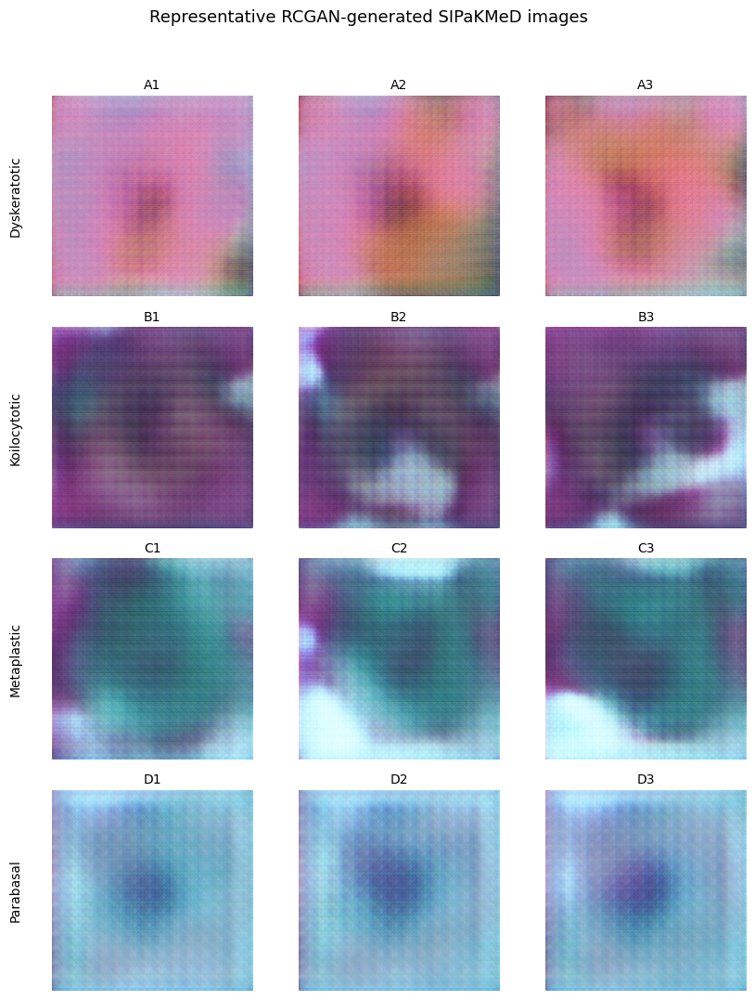


S2 COMPLETED
PNG: /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S2_RCGAN_Synthetic_Samples_600dpi.png
TIFF: /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S2_RCGAN_Synthetic_Samples_600dpi.tif


In [ ]:
# ============================================================
# SUPPLEMENTARY FIGURE S2
# Representative RCGAN-generated SIPaKMeD images
# ============================================================

from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------
BASE = Path(
    "/content/drive/MyDrive/Cervix_frontiers/01_Datasets/"
    "SIPaKMeD_RCGAN_Augmented/train"
)

OUT = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results/"
    "SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/"
    "Figures"
)

OUT.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# Exact synthetic-image classes
# ------------------------------------------------------------
classes = [
    ("Dyskeratotic", "Class 0"),
    ("Koilocytotic", "Class 1"),
    ("Metaplastic", "Class 2"),
    ("Parabasal", "Class 3"),
]

# ------------------------------------------------------------
# Collect ONLY synthetic_rcgan files
# ------------------------------------------------------------
synthetic_files = {}

for class_name, class_id in classes:

    folder = BASE / class_name

    files = sorted(
        [
            p for p in folder.iterdir()
            if p.is_file()
            and p.name.startswith("synthetic_rcgan_")
            and p.suffix.lower() == ".png"
        ]
    )

    synthetic_files[class_name] = files

    print(
        f"{class_name:25s} : "
        f"{len(files):2d} synthetic images"
    )

# ------------------------------------------------------------
# Verify expected counts
# ------------------------------------------------------------
expected_counts = {
    "Dyskeratotic": 12,
    "Koilocytotic": 4,
    "Metaplastic": 26,
    "Parabasal": 31,
}

for class_name, expected in expected_counts.items():

    actual = len(synthetic_files[class_name])

    assert actual == expected, (
        f"{class_name}: expected {expected}, found {actual}"
    )

print("\n✓ All 73 synthetic images verified.")

# ------------------------------------------------------------
# Deterministic representative selection
# ------------------------------------------------------------
# Three evenly distributed images per class.
selected = {}

for class_name, files in synthetic_files.items():

    n = len(files)

    # Three deterministic positions across the available files
    indices = np.linspace(0, n - 1, 3).round().astype(int)

    selected[class_name] = [
        files[int(i)] for i in indices
    ]

    print(f"\n{class_name}:")
    for p in selected[class_name]:
        print("  ", p.name)

# ------------------------------------------------------------
# Create 4 × 3 figure
# ------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=4,
    ncols=3,
    figsize=(9, 11)
)

for row, (class_name, class_id) in enumerate(classes):

    files = selected[class_name]

    for col, file_path in enumerate(files):

        img = Image.open(file_path).convert("RGB")

        axes[row, col].imshow(img)
        axes[row, col].axis("off")

        # Panel label
        panel = chr(ord("A") + row)

        axes[row, col].set_title(
            f"{panel}{col + 1}",
            fontsize=10,
            pad=5
        )

    # Class label on left side
    axes[row, 0].text(
        -0.18,
        0.5,
        class_name,
        transform=axes[row, 0].transAxes,
        rotation=90,
        va="center",
        ha="center",
        fontsize=10
    )

fig.suptitle(
    "Representative RCGAN-generated SIPaKMeD images",
    fontsize=13,
    y=0.995
)

plt.tight_layout(rect=[0.04, 0.02, 1, 0.97])

# ------------------------------------------------------------
# Save publication-quality files
# ------------------------------------------------------------
png_path = OUT / "Supplementary_Figure_S2_RCGAN_Synthetic_Samples_600dpi.png"
tif_path = OUT / "Supplementary_Figure_S2_RCGAN_Synthetic_Samples_600dpi.tif"

fig.savefig(
    png_path,
    dpi=600,
    bbox_inches="tight"
)

fig.savefig(
    tif_path,
    dpi=600,
    bbox_inches="tight"
)

plt.show()

print("\n" + "=" * 80)
print("S2 COMPLETED")
print("=" * 80)
print("PNG:", png_path)
print("TIFF:", tif_path)

In [ ]:
from pathlib import Path

fig_dir = Path(
    "/content/drive/MyDrive/Cervix_frontiers/"
    "07_Results/SIPaKMeD_Comparative_Analysis/"
    "Final_Explainability_Uncertainty/Figures"
)

files = [
    "Figure_31_5_classwise_confidence.png",
    "Figure_31_6_classwise_entropy.png",
]

print("=" * 80)
print("S3 SOURCE FIGURES")
print("=" * 80)

for name in files:
    path = fig_dir / name
    print(f"{name}: {'FOUND' if path.exists() else 'NOT FOUND'}")
    if path.exists():
        print(f"  Size: {path.stat().st_size:,} bytes")

print("=" * 80)

S3 SOURCE FIGURES
Figure_31_5_classwise_confidence.png: FOUND
  Size: 438,880 bytes
Figure_31_6_classwise_entropy.png: FOUND
  Size: 470,790 bytes


Confidence figure: (6537, 3529)
Entropy figure: (6538, 3529)


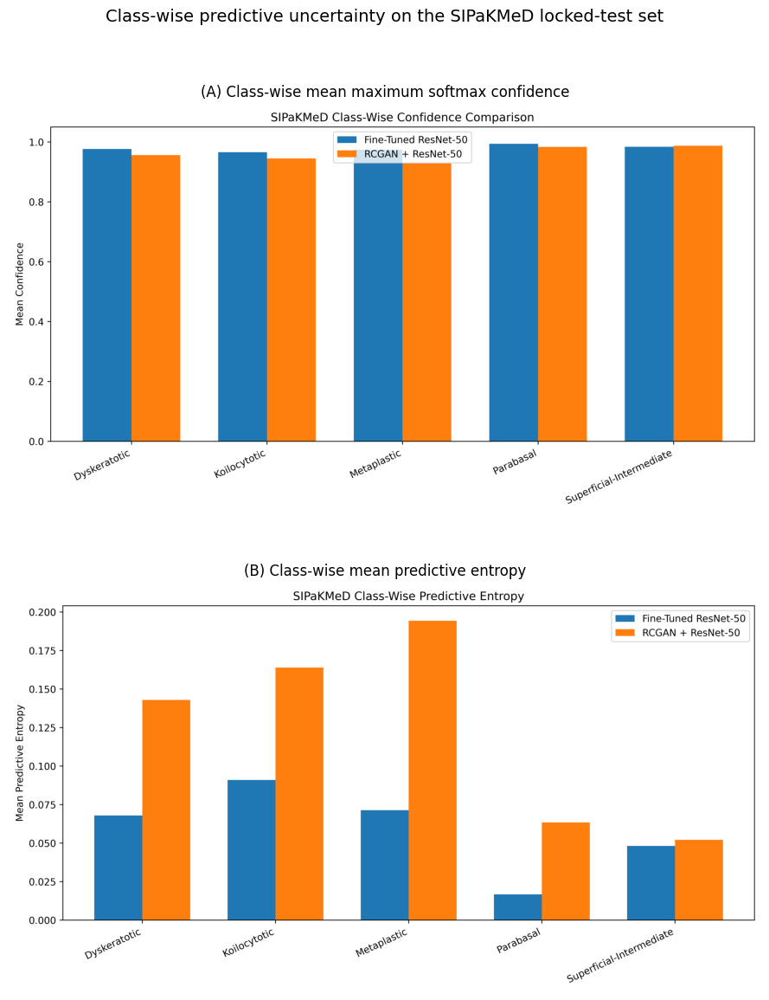


S3 COMPLETED
PNG : /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S3_Classwise_Uncertainty_600dpi.png
TIFF: /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S3_Classwise_Uncertainty_600dpi.tif


In [ ]:
# ============================================================
# SUPPLEMENTARY FIGURE S3
# Class-wise Predictive Uncertainty — SIPaKMeD
# ============================================================

from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------
FIG_DIR = Path(
    "/content/drive/MyDrive/Cervix_frontiers/"
    "07_Results/SIPaKMeD_Comparative_Analysis/"
    "Final_Explainability_Uncertainty/Figures"
)

confidence_path = FIG_DIR / "Figure_31_5_classwise_confidence.png"
entropy_path = FIG_DIR / "Figure_31_6_classwise_entropy.png"

assert confidence_path.exists(), "Confidence figure not found."
assert entropy_path.exists(), "Entropy figure not found."

# ------------------------------------------------------------
# Load existing figures
# ------------------------------------------------------------
confidence_img = Image.open(confidence_path).convert("RGB")
entropy_img = Image.open(entropy_path).convert("RGB")

print("Confidence figure:", confidence_img.size)
print("Entropy figure:", entropy_img.size)

# ------------------------------------------------------------
# Create 2-panel S3
# ------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=2,
    ncols=1,
    figsize=(9, 12)
)

# Panel A
axes[0].imshow(confidence_img)
axes[0].axis("off")
axes[0].set_title(
    "(A) Class-wise mean maximum softmax confidence",
    fontsize=12,
    pad=8
)

# Panel B
axes[1].imshow(entropy_img)
axes[1].axis("off")
axes[1].set_title(
    "(B) Class-wise mean predictive entropy",
    fontsize=12,
    pad=8
)

fig.suptitle(
    "Class-wise predictive uncertainty on the SIPaKMeD locked-test set",
    fontsize=14,
    y=0.995
)

plt.tight_layout(rect=[0, 0, 1, 0.98])

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------
s3_png = FIG_DIR / (
    "Supplementary_Figure_S3_Classwise_Uncertainty_600dpi.png"
)

s3_tif = FIG_DIR / (
    "Supplementary_Figure_S3_Classwise_Uncertainty_600dpi.tif"
)

fig.savefig(
    s3_png,
    dpi=600,
    bbox_inches="tight"
)

fig.savefig(
    s3_tif,
    dpi=600,
    bbox_inches="tight"
)

plt.show()

print("\n" + "=" * 90)
print("S3 COMPLETED")
print("=" * 90)
print("PNG :", s3_png)
print("TIFF:", s3_tif)

Confidence figure: (5337, 3525)
Entropy figure: (5337, 3525)


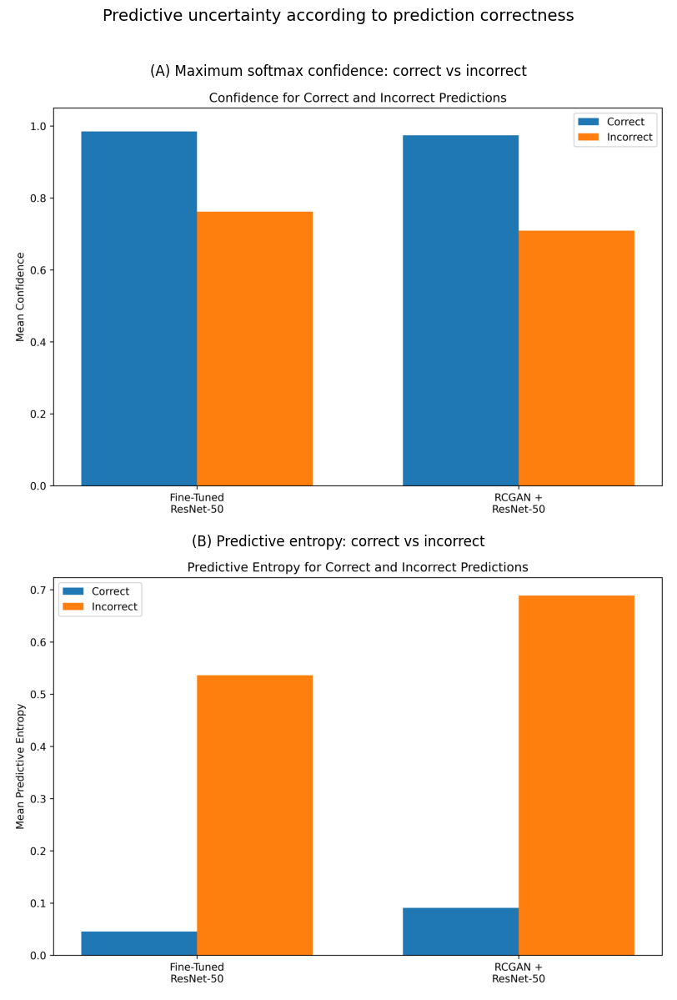


S4 COMPLETED
PNG : /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S4_Correct_Incorrect_Uncertainty_600dpi.png
TIFF: /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S4_Correct_Incorrect_Uncertainty_600dpi.tif


In [ ]:
# ============================================================
# SUPPLEMENTARY FIGURE S4
# Correct vs Incorrect Predictive Uncertainty — SIPaKMeD
# ============================================================

from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------
FIG_DIR = Path(
    "/content/drive/MyDrive/Cervix_frontiers/"
    "07_Results/SIPaKMeD_Comparative_Analysis/"
    "Final_Explainability_Uncertainty/Figures"
)

confidence_path = (
    FIG_DIR / "Figure_31_7_correct_incorrect_confidence.png"
)

entropy_path = (
    FIG_DIR / "Figure_31_8_correct_incorrect_entropy.png"
)

assert confidence_path.exists(), (
    "Correct/incorrect confidence figure not found."
)

assert entropy_path.exists(), (
    "Correct/incorrect entropy figure not found."
)

# ------------------------------------------------------------
# Load existing verified figures
# ------------------------------------------------------------
confidence_img = Image.open(
    confidence_path
).convert("RGB")

entropy_img = Image.open(
    entropy_path
).convert("RGB")

print("Confidence figure:", confidence_img.size)
print("Entropy figure:", entropy_img.size)

# ------------------------------------------------------------
# Create S4
# ------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=2,
    ncols=1,
    figsize=(9, 12)
)

# Panel A
axes[0].imshow(confidence_img)
axes[0].axis("off")
axes[0].set_title(
    "(A) Maximum softmax confidence: correct vs incorrect",
    fontsize=12,
    pad=8
)

# Panel B
axes[1].imshow(entropy_img)
axes[1].axis("off")
axes[1].set_title(
    "(B) Predictive entropy: correct vs incorrect",
    fontsize=12,
    pad=8
)

fig.suptitle(
    "Predictive uncertainty according to prediction correctness",
    fontsize=14,
    y=0.995
)

plt.tight_layout(
    rect=[0, 0, 1, 0.98]
)

# ------------------------------------------------------------
# Save S4
# ------------------------------------------------------------
s4_png = FIG_DIR / (
    "Supplementary_Figure_S4_Correct_Incorrect_Uncertainty_600dpi.png"
)

s4_tif = FIG_DIR / (
    "Supplementary_Figure_S4_Correct_Incorrect_Uncertainty_600dpi.tif"
)

fig.savefig(
    s4_png,
    dpi=600,
    bbox_inches="tight"
)

fig.savefig(
    s4_tif,
    dpi=600,
    bbox_inches="tight"
)

plt.show()

print("\n" + "=" * 90)
print("S4 COMPLETED")
print("=" * 90)
print("PNG :", s4_png)
print("TIFF:", s4_tif)

In [ ]:
from pathlib import Path

base = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results"
)

print("=" * 100)
print("CONFUSION MATRIX / LOCKED-TEST PREDICTION OUTPUTS")
print("=" * 100)

keywords = [
    "confusion",
    "prediction",
    "predictions",
    "test_predictions",
    "y_true",
    "y_pred",
]

extensions = {
    ".png", ".jpg", ".jpeg", ".tif", ".tiff",
    ".csv", ".xlsx", ".json", ".pkl", ".pickle",
    ".pt", ".pth"
}

results = []

for p in base.rglob("*"):

    if not p.is_file():
        continue

    if p.suffix.lower() not in extensions:
        continue

    name = p.name.lower()
    path = str(p).lower()

    if any(k in name or k in path for k in keywords):
        results.append(p)

for p in sorted(results):
    print(p)

print("\n" + "=" * 100)
print("TOTAL:", len(results))
print("=" * 100)

CONFUSION MATRIX / LOCKED-TEST PREDICTION OUTPUTS
/content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/Final_Refit/final_643_refit_confusion_matrix.csv
/content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/Final_Refit/final_643_refit_predictions.csv
/content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/clean_herlev_locked_test_confusion_matrix.csv
/content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/clean_herlev_locked_test_predictions.csv
/content/drive/MyDrive/Cervix_frontiers/07_Results/Final_Model/resnet50_test_confusion_matrix.png
/content/drive/MyDrive/Cervix_frontiers/07_Results/Final_Model/resnet50_test_predictions.csv
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/Tables/herlev_paired_uncertainty_by_prediction_group.csv
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/Tables/herlev_prediction_agreement_274.csv
/content/drive/MyDriv

S5 SOURCE VERIFICATION

Herlev — Fine-tuned ResNet-50
Path: /content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_ResNet50_FineTuned/Locked_Test_Evaluation/finetuned_resnet50_locked_test_confusion_matrix.csv
Exists: True

Herlev — RCGAN + ResNet-50
Path: /content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_RCGAN_ResNet50/Locked_Test_Evaluation/rcgan_resnet50_locked_test_confusion_matrix.csv
Exists: True

SIPaKMeD — Fine-tuned ResNet-50
Path: /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Tables/sipakmed_baseline_confusion_matrix.csv
Exists: True

SIPaKMeD — RCGAN + ResNet-50
Path: /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Tables/sipakmed_rcgan_confusion_matrix.csv
Exists: True

----------------------------------------------------------------------------------------------------
Herlev — Fine-tuned ResNet-50
----------------------------------------------------------------------------------------------------

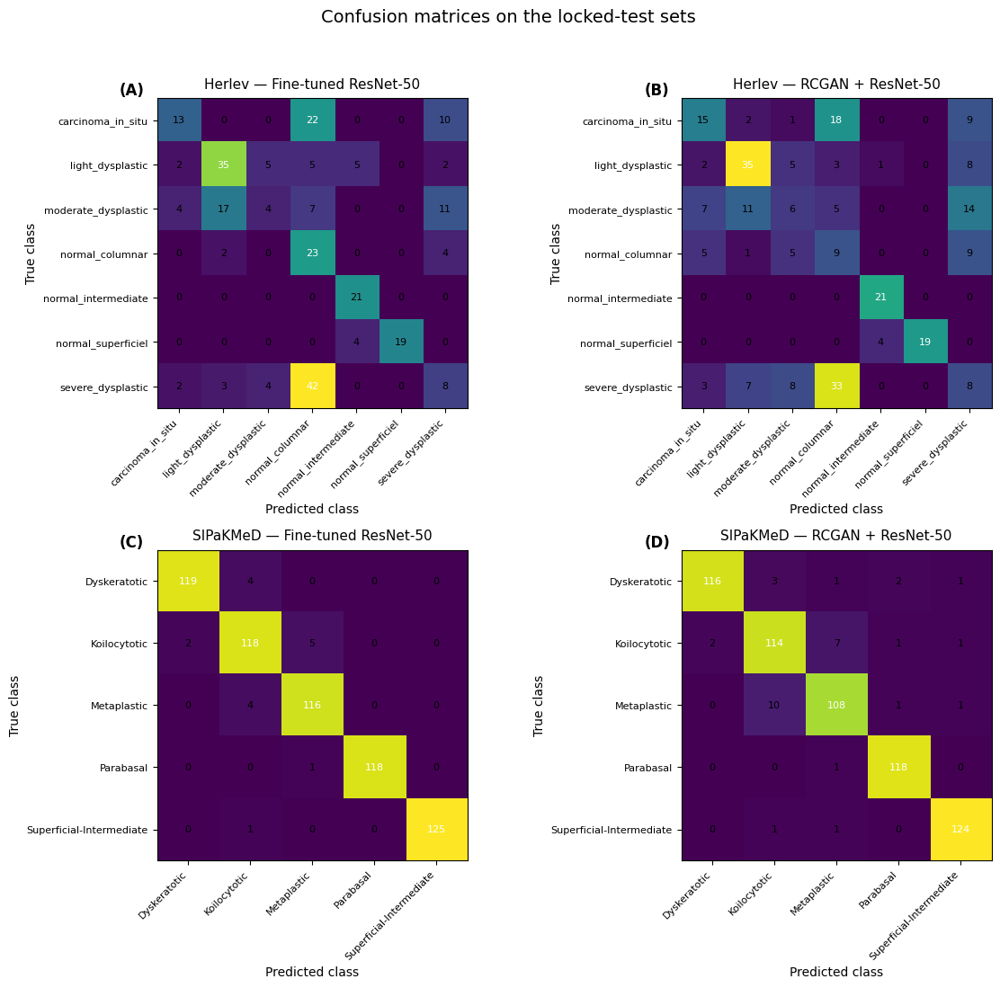


S5 COMPLETED
PNG : /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S5_Locked_Test_Confusion_Matrices_600dpi.png
TIFF: /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S5_Locked_Test_Confusion_Matrices_600dpi.tif


In [ ]:
# ============================================================
# SUPPLEMENTARY FIGURE S5
# Locked-Test Confusion Matrices
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------
ROOT = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results"
)

sources = {
    "Herlev — Fine-tuned ResNet-50":
        ROOT /
        "Herlev_ResNet50_FineTuned/Locked_Test_Evaluation/"
        "finetuned_resnet50_locked_test_confusion_matrix.csv",

    "Herlev — RCGAN + ResNet-50":
        ROOT /
        "Herlev_RCGAN_ResNet50/Locked_Test_Evaluation/"
        "rcgan_resnet50_locked_test_confusion_matrix.csv",

    "SIPaKMeD — Fine-tuned ResNet-50":
        ROOT /
        "SIPaKMeD_Comparative_Analysis/Tables/"
        "sipakmed_baseline_confusion_matrix.csv",

    "SIPaKMeD — RCGAN + ResNet-50":
        ROOT /
        "SIPaKMeD_Comparative_Analysis/Tables/"
        "sipakmed_rcgan_confusion_matrix.csv",
}

# ------------------------------------------------------------
# Verify source files
# ------------------------------------------------------------
print("=" * 100)
print("S5 SOURCE VERIFICATION")
print("=" * 100)

for name, path in sources.items():

    print(f"\n{name}")
    print("Path:", path)
    print("Exists:", path.exists())

    assert path.exists(), f"Missing source file: {path}"

# ------------------------------------------------------------
# Read confusion matrices
# ------------------------------------------------------------
matrices = {}

for name, path in sources.items():

    df = pd.read_csv(path)

    print("\n" + "-" * 100)
    print(name)
    print("-" * 100)
    print(df)

    matrices[name] = df

# ------------------------------------------------------------
# Helper function
# ------------------------------------------------------------
def extract_matrix(df):

    """
    Handles common CSV layouts:
      1. First column = row/class labels
      2. Remaining columns = confusion matrix

    If the CSV is already purely numeric, uses it directly.
    """

    # Remove completely empty columns
    df = df.dropna(axis=1, how="all")

    # Try numeric conversion
    numeric_df = df.apply(
        pd.to_numeric,
        errors="coerce"
    )

    # If first column is non-numeric and remaining are numeric,
    # treat first column as class labels.
    if numeric_df.iloc[:, 0].isna().all():

        labels = df.iloc[:, 0].astype(str).tolist()

        matrix = numeric_df.iloc[:, 1:].to_numpy()

        return matrix, labels

    # Otherwise all columns should represent the matrix
    matrix = numeric_df.to_numpy()

    labels = [str(c) for c in df.columns]

    return matrix, labels


# ------------------------------------------------------------
# Extract and verify matrices
# ------------------------------------------------------------
processed = {}

for name, df in matrices.items():

    matrix, labels = extract_matrix(df)

    matrix = np.asarray(matrix, dtype=float)

    assert matrix.ndim == 2, (
        f"{name}: confusion matrix is not 2-dimensional."
    )

    assert matrix.shape[0] == matrix.shape[1], (
        f"{name}: matrix is not square: {matrix.shape}"
    )

    # Confusion matrix should contain integer counts
    assert np.allclose(matrix, np.round(matrix)), (
        f"{name}: matrix contains non-integer values."
    )

    matrix = matrix.astype(int)

    processed[name] = (matrix, labels)

    print(
        f"\n{name}: "
        f"{matrix.shape[0]} × {matrix.shape[1]} matrix | "
        f"N = {matrix.sum()}"
    )

# ------------------------------------------------------------
# Create S5
# ------------------------------------------------------------
fig, axes = plt.subplots(
    2,
    2,
    figsize=(12, 11)
)

axes = axes.flatten()

titles = list(processed.keys())

for ax, title in zip(axes, titles):

    matrix, labels = processed[title]

    # Display matrix
    im = ax.imshow(matrix)

    # Tick labels
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))

    ax.set_xticklabels(
        labels,
        rotation=45,
        ha="right",
        fontsize=8
    )

    ax.set_yticklabels(
        labels,
        fontsize=8
    )

    ax.set_xlabel("Predicted class", fontsize=10)
    ax.set_ylabel("True class", fontsize=10)

    ax.set_title(
        title,
        fontsize=11,
        pad=8
    )

    # Add count annotations
    max_value = matrix.max()

    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):

            value = matrix[i, j]

            # Choose readable annotation automatically
            threshold = max_value * 0.5

            text_color = (
                "white" if value > threshold
                else "black"
            )

            ax.text(
                j,
                i,
                str(value),
                ha="center",
                va="center",
                fontsize=8,
                color=text_color
            )

    # Panel label
    panel_index = list(processed.keys()).index(title)
    panel_letter = chr(ord("A") + panel_index)

    ax.text(
        -0.12,
        1.05,
        f"({panel_letter})",
        transform=ax.transAxes,
        fontsize=12,
        fontweight="bold",
        va="top"
    )

# ------------------------------------------------------------
# Shared title
# ------------------------------------------------------------
fig.suptitle(
    "Confusion matrices on the locked-test sets",
    fontsize=14,
    y=0.995
)

plt.tight_layout(
    rect=[0, 0, 1, 0.97]
)

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------
OUT = (
    ROOT /
    "SIPaKMeD_Comparative_Analysis/"
    "Final_Explainability_Uncertainty/Figures"
)

OUT.mkdir(
    parents=True,
    exist_ok=True
)

png_path = (
    OUT /
    "Supplementary_Figure_S5_Locked_Test_Confusion_Matrices_600dpi.png"
)

tif_path = (
    OUT /
    "Supplementary_Figure_S5_Locked_Test_Confusion_Matrices_600dpi.tif"
)

fig.savefig(
    png_path,
    dpi=600,
    bbox_inches="tight"
)

fig.savefig(
    tif_path,
    dpi=600,
    bbox_inches="tight"
)

plt.show()

print("\n" + "=" * 100)
print("S5 COMPLETED")
print("=" * 100)
print("PNG :", png_path)
print("TIFF:", tif_path)

In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np

ROOT = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results"
)

files = [
    ROOT / "Experiment_Clean_Herlev/Final_Refit/final_643_refit_predictions.csv",
    ROOT / "Experiment_Clean_Herlev/clean_herlev_locked_test_predictions.csv",
    ROOT / "Final_Model/resnet50_test_predictions.csv",
    ROOT / "Herlev_ResNet50_FineTuned/Locked_Test_Evaluation/"
          "finetuned_resnet50_locked_test_predictions.csv",
]

print("=" * 100)
print("HERLEV BASELINE PREDICTION FILE VERIFICATION")
print("=" * 100)

for path in files:

    print("\n" + "-" * 100)
    print(path)
    print("Exists:", path.exists())

    if not path.exists():
        continue

    df = pd.read_csv(path)

    print("Shape:", df.shape)
    print("Columns:")
    print(list(df.columns))

    # Find likely true/predicted columns
    true_candidates = [
        c for c in df.columns
        if any(x in c.lower() for x in [
            "true", "actual", "ground"
        ])
    ]

    pred_candidates = [
        c for c in df.columns
        if any(x in c.lower() for x in [
            "pred", "prediction"
        ])
    ]

    print("Possible true-label columns:", true_candidates)
    print("Possible prediction columns:", pred_candidates)

    # Try common exact names first
    true_col = None
    pred_col = None

    for c in [
        "true_label",
        "true",
        "y_true",
        "actual",
        "actual_label",
        "True_Label"
    ]:
        if c in df.columns:
            true_col = c
            break

    for c in [
        "predicted_label",
        "prediction",
        "predicted",
        "y_pred",
        "Predicted_Label"
    ]:
        if c in df.columns:
            pred_col = c
            break

    if true_col is not None and pred_col is not None:

        y_true = df[true_col].astype(str)
        y_pred = df[pred_col].astype(str)

        correct = (y_true == y_pred).sum()
        n = len(df)
        accuracy = correct / n

        print(
            f"Using {true_col} vs {pred_col}: "
            f"{correct}/{n} correct = "
            f"{accuracy:.4%}"
        )

    else:
        print("Could not automatically identify label columns.")

print("\n" + "=" * 100)
print("TARGET: 43.07% = approximately 118/274 correct")
print("=" * 100)

HERLEV BASELINE PREDICTION FILE VERIFICATION

----------------------------------------------------------------------------------------------------
/content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/Final_Refit/final_643_refit_predictions.csv
Exists: True
Shape: (274, 4)
Columns:
['true_label', 'predicted_label', 'true_class', 'predicted_class']
Possible true-label columns: ['true_label', 'true_class']
Possible prediction columns: ['predicted_label', 'predicted_class']
Using true_label vs predicted_label: 120/274 correct = 43.7956%

----------------------------------------------------------------------------------------------------
/content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/clean_herlev_locked_test_predictions.csv
Exists: True
Shape: (274, 4)
Columns:
['true_label', 'predicted_label', 'true_class', 'predicted_class']
Possible true-label columns: ['true_label', 'true_class']
Possible prediction columns: ['predicted_label', 'predicte

In [ ]:
from pathlib import Path
import pandas as pd

path = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results/"
    "Herlev_ResNet50_FineTuned/Locked_Test_Evaluation/"
    "finetuned_resnet50_locked_test_predictions.csv"
)

df = pd.read_csv(path)

print("=" * 90)
print("FINE-TUNED HERLEV LOCKED-TEST PREDICTIONS")
print("=" * 90)

print("Rows:", len(df))
print("Columns:", list(df.columns))

true_col = "true_class"
pred_col = "predicted_class"

correct = (
    df[true_col].astype(str)
    == df[pred_col].astype(str)
).sum()

print(f"\nCorrect: {correct}")
print(f"Total:   {len(df)}")
print(f"Accuracy: {correct / len(df):.6f}")
print(f"Accuracy: {correct / len(df) * 100:.2f}%")

FINE-TUNED HERLEV LOCKED-TEST PREDICTIONS
Rows: 274
Columns: ['image_path', 'true_class_id', 'true_class', 'predicted_class_id', 'predicted_class', 'correct', 'confidence']

Correct: 123
Total:   274
Accuracy: 0.448905
Accuracy: 44.89%


In [ ]:
from pathlib import Path
import pandas as pd

base = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results"
)

print("=" * 110)
print("SEARCHING ALL HERLEV CSV FILES FOR 274-IMAGE PREDICTION OUTPUTS")
print("=" * 110)

matches = []

for path in base.rglob("*.csv"):

    path_str = str(path).lower()

    # Focus on Herlev-related files
    if "herlev" not in path_str:
        continue

    try:
        df = pd.read_csv(path)
    except Exception:
        continue

    if len(df) != 274:
        continue

    cols_lower = {c.lower(): c for c in df.columns}

    # Locate true/prediction columns
    true_col = None
    pred_col = None

    for c in df.columns:
        cl = c.lower()

        if true_col is None and (
            cl in ["true_class", "true_label", "actual", "y_true"]
            or ("true" in cl and "class" in cl)
        ):
            true_col = c

        if pred_col is None and (
            cl in ["predicted_class", "predicted_label", "prediction", "y_pred"]
            or ("pred" in cl and "class" in cl)
        ):
            pred_col = c

    if true_col is None or pred_col is None:
        continue

    correct = (
        df[true_col].astype(str)
        == df[pred_col].astype(str)
    ).sum()

    accuracy = correct / 274

    matches.append(
        (path, correct, accuracy, true_col, pred_col)
    )

print("\n274-row Herlev prediction files found:")
print("-" * 110)

for path, correct, accuracy, true_col, pred_col in matches:

    marker = "  <-- TARGET 43.07%" if correct == 118 else ""

    print(
        f"{correct:3d}/274 = {accuracy*100:7.3f}% | "
        f"{path}{marker}"
    )

print("\n" + "=" * 110)
print("TARGET:")
print("118/274 = 43.0657% ≈ 43.07%")
print("=" * 110)

SEARCHING ALL HERLEV CSV FILES FOR 274-IMAGE PREDICTION OUTPUTS

274-row Herlev prediction files found:
--------------------------------------------------------------------------------------------------------------
112/274 =  40.876% | /content/drive/MyDrive/Cervix_frontiers/07_Results/Experiment_Clean_Herlev/clean_herlev_locked_test_predictions.csv
118/274 =  43.066% | /content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/Uncertainty_Comparison/fine_tuned_resnet50_uncertainty.csv  <-- TARGET 43.07%
113/274 =  41.241% | /content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/Uncertainty_Comparison/rcgan_resnet50_uncertainty.csv
118/274 =  43.066% | /content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/GradCAM_Comparison_Analysis/representative_baseline_uncertainty.csv  <-- TARGET 43.07%
113/274 =  41.241% | /content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/GradCAM_Comparison_Analysis/r

HERLEV VERIFICATION
Baseline: 118 / 274
RCGAN: 113 / 274

Herlev class mapping:
 true_class_id          true_class
             0   carcinoma_in_situ
             1    light_dysplastic
             2 moderate_dysplastic
             3     normal_columnar
             4 normal_intermediate
             5  normal_superficiel
             6   severe_dysplastic

Class IDs: [0, 1, 2, 3, 4, 5, 6]
Class labels: ['carcinoma_in_situ', 'light_dysplastic', 'moderate_dysplastic', 'normal_columnar', 'normal_intermediate', 'normal_superficiel', 'severe_dysplastic']

RCGAN class mapping:
 true_class_id          true_class
             0   carcinoma_in_situ
             1    light_dysplastic
             2 moderate_dysplastic
             3     normal_columnar
             4 normal_intermediate
             5  normal_superficiel
             6   severe_dysplastic

✓ Herlev class mapping is identical.

Herlev baseline confusion matrix:
[[10  1  0 19  0  0 15]
 [ 2 35  3  6  4  0  4]
 [ 3 12  5  6  3  0

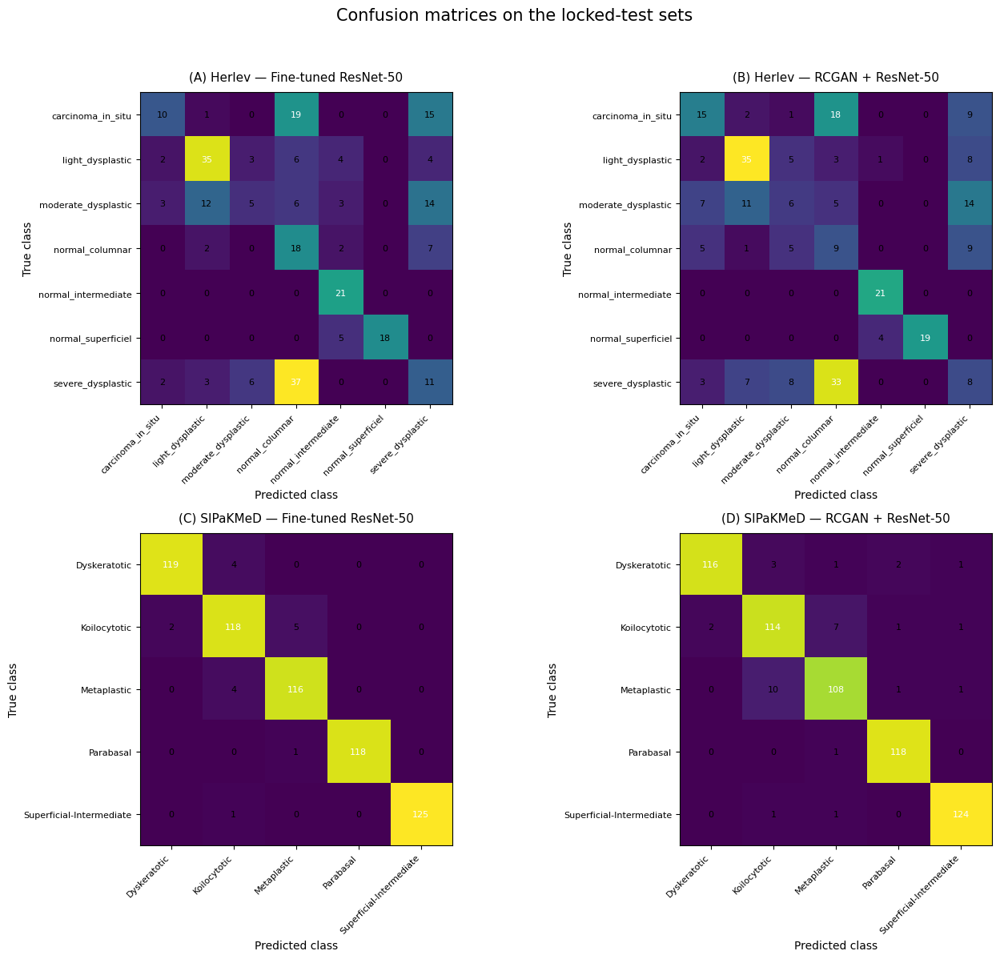


S5 FINAL VERIFICATION
Herlev baseline  : 118/274 = 43.07%
Herlev RCGAN     : 113/274 = 41.24%
SIPaKMeD baseline: 596/613 = 97.23%
SIPaKMeD RCGAN   : 580/613 = 94.62%

PNG : /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S5_Locked_Test_Confusion_Matrices_FINAL_600dpi.png
TIFF: /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S5_Locked_Test_Confusion_Matrices_FINAL_600dpi.tif

✓ S5 generation completed.


In [ ]:
# ============================================================
# S5 — CORRECTED CONFUSION MATRICES
# Uses exact class IDs and labels from the verified prediction
# files. No experiment is rerun.
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

ROOT = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results"
)

OUT = (
    ROOT /
    "SIPaKMeD_Comparative_Analysis/"
    "Final_Explainability_Uncertainty/Figures"
)

OUT.mkdir(parents=True, exist_ok=True)


# ============================================================
# 1. SOURCE FILES
# ============================================================

herlev_baseline_path = (
    ROOT /
    "Herlev_Comparative_Analysis/"
    "Uncertainty_Comparison/"
    "fine_tuned_resnet50_uncertainty.csv"
)

herlev_rcgan_path = (
    ROOT /
    "Herlev_Comparative_Analysis/"
    "Uncertainty_Comparison/"
    "rcgan_resnet50_uncertainty.csv"
)

sipakmed_baseline_path = (
    ROOT /
    "SIPaKMeD_Comparative_Analysis/"
    "Tables/"
    "sipakmed_baseline_confusion_matrix.csv"
)

sipakmed_rcgan_path = (
    ROOT /
    "SIPaKMeD_Comparative_Analysis/"
    "Tables/"
    "sipakmed_rcgan_confusion_matrix.csv"
)


# ============================================================
# 2. LOAD HERLEV PREDICTIONS
# ============================================================

hb = pd.read_csv(herlev_baseline_path)
hr = pd.read_csv(herlev_rcgan_path)

assert len(hb) == 274
assert len(hr) == 274

print("=" * 100)
print("HERLEV VERIFICATION")
print("=" * 100)

print(
    "Baseline:",
    (hb["true_class"] == hb["predicted_class"]).sum(),
    "/ 274"
)

print(
    "RCGAN:",
    (hr["true_class"] == hr["predicted_class"]).sum(),
    "/ 274"
)


# ============================================================
# 3. DERIVE HERLEV CLASS ORDER FROM CLASS IDs
# ============================================================

# The prediction files already contain the authoritative
# true_class_id and true_class pairing.

herlev_mapping = (
    hb[
        ["true_class_id", "true_class"]
    ]
    .drop_duplicates()
    .sort_values("true_class_id")
)

print("\nHerlev class mapping:")
print(herlev_mapping.to_string(index=False))

herlev_ids = (
    herlev_mapping["true_class_id"]
    .astype(int)
    .tolist()
)

herlev_labels = (
    herlev_mapping["true_class"]
    .astype(str)
    .tolist()
)

print("\nClass IDs:", herlev_ids)
print("Class labels:", herlev_labels)


# ============================================================
# 4. VERIFY SAME CLASS MAPPING IN RCGAN DATA
# ============================================================

rcgan_mapping = (
    hr[
        ["true_class_id", "true_class"]
    ]
    .drop_duplicates()
    .sort_values("true_class_id")
)

print("\nRCGAN class mapping:")
print(rcgan_mapping.to_string(index=False))

assert (
    rcgan_mapping["true_class_id"].astype(int).tolist()
    == herlev_ids
)

assert (
    rcgan_mapping["true_class"].astype(str).tolist()
    == herlev_labels
)

print("\n✓ Herlev class mapping is identical.")


# ============================================================
# 5. CREATE HERLEV CONFUSION MATRICES
# ============================================================

cm_hb = confusion_matrix(
    hb["true_class"],
    hb["predicted_class"],
    labels=herlev_labels
)

cm_hr = confusion_matrix(
    hr["true_class"],
    hr["predicted_class"],
    labels=herlev_labels
)

print("\nHerlev baseline confusion matrix:")
print(cm_hb)

print("\nHerlev RCGAN confusion matrix:")
print(cm_hr)


# ============================================================
# 6. VERIFY HERLEV MATRICES
# ============================================================

assert cm_hb.sum() == 274
assert cm_hr.sum() == 274

assert np.trace(cm_hb) == 118
assert np.trace(cm_hr) == 113

print("\n✓ Herlev baseline: 118/274 = 43.07%")
print("✓ Herlev RCGAN:    113/274 = 41.24%")


# ============================================================
# 7. LOAD SIPAKMED MATRICES
# ============================================================

sb_df = pd.read_csv(sipakmed_baseline_path)
sr_df = pd.read_csv(sipakmed_rcgan_path)

print("\n" + "=" * 100)
print("SIPAKMeD SOURCE MATRICES")
print("=" * 100)

print("\nBaseline:")
print(sb_df.to_string(index=False))

print("\nRCGAN:")
print(sr_df.to_string(index=False))


# ============================================================
# 8. EXTRACT SIPAKMED MATRIX
# ============================================================

def extract_matrix(df):

    df = df.dropna(axis=1, how="all")

    numeric = df.apply(
        pd.to_numeric,
        errors="coerce"
    )

    # First column contains row labels
    if numeric.iloc[:, 0].isna().all():

        labels = (
            df.iloc[:, 0]
            .astype(str)
            .tolist()
        )

        matrix = (
            numeric.iloc[:, 1:]
            .to_numpy()
        )

    else:

        labels = [
            str(c)
            for c in df.columns
        ]

        matrix = numeric.to_numpy()

    matrix = np.asarray(
        matrix,
        dtype=int
    )

    assert matrix.shape[0] == matrix.shape[1]

    return matrix, labels


cm_sb, sip_labels_b = extract_matrix(sb_df)
cm_sr, sip_labels_r = extract_matrix(sr_df)

print("\nSIPaKMeD baseline N:", cm_sb.sum())
print("SIPaKMeD RCGAN N:", cm_sr.sum())

assert cm_sb.sum() == 613
assert cm_sr.sum() == 613

assert np.trace(cm_sb) == 596
assert np.trace(cm_sr) == 580

print("\n✓ SIPaKMeD baseline: 596/613 = 97.23%")
print("✓ SIPaKMeD RCGAN:    580/613 = 94.62%")


# ============================================================
# 9. FINAL MATRICES
# ============================================================

matrix_data = [
    (
        cm_hb,
        herlev_labels,
        "(A) Herlev — Fine-tuned ResNet-50"
    ),
    (
        cm_hr,
        herlev_labels,
        "(B) Herlev — RCGAN + ResNet-50"
    ),
    (
        cm_sb,
        sip_labels_b,
        "(C) SIPaKMeD — Fine-tuned ResNet-50"
    ),
    (
        cm_sr,
        sip_labels_r,
        "(D) SIPaKMeD — RCGAN + ResNet-50"
    )
]


# ============================================================
# 10. CREATE FIGURE
# ============================================================

fig, axes = plt.subplots(
    2,
    2,
    figsize=(14, 12)
)

axes = axes.flatten()


for ax, (matrix, labels, title) in zip(
    axes,
    matrix_data
):

    im = ax.imshow(matrix)

    n = len(labels)

    ax.set_xticks(
        np.arange(n)
    )

    ax.set_yticks(
        np.arange(n)
    )

    ax.set_xticklabels(
        labels,
        rotation=45,
        ha="right",
        fontsize=8
    )

    ax.set_yticklabels(
        labels,
        fontsize=8
    )

    ax.set_xlabel(
        "Predicted class",
        fontsize=10
    )

    ax.set_ylabel(
        "True class",
        fontsize=10
    )

    ax.set_title(
        title,
        fontsize=11,
        pad=10
    )

    # --------------------------------------------------------
    # Count annotations
    # --------------------------------------------------------

    max_value = matrix.max()

    for i in range(n):

        for j in range(n):

            value = matrix[i, j]

            text_color = (
                "white"
                if value > max_value * 0.5
                else "black"
            )

            ax.text(
                j,
                i,
                str(value),
                ha="center",
                va="center",
                fontsize=8,
                color=text_color
            )


# ============================================================
# 11. SHARED TITLE
# ============================================================

fig.suptitle(
    "Confusion matrices on the locked-test sets",
    fontsize=15,
    y=0.995
)

plt.tight_layout(
    rect=[0, 0, 1, 0.97]
)


# ============================================================
# 12. SAVE
# ============================================================

png_path = (
    OUT /
    "Supplementary_Figure_S5_Locked_Test_"
    "Confusion_Matrices_FINAL_600dpi.png"
)

tif_path = (
    OUT /
    "Supplementary_Figure_S5_Locked_Test_"
    "Confusion_Matrices_FINAL_600dpi.tif"
)

fig.savefig(
    png_path,
    dpi=600,
    bbox_inches="tight"
)

fig.savefig(
    tif_path,
    dpi=600,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 13. FINAL VERIFICATION
# ============================================================

print("\n" + "=" * 100)
print("S5 FINAL VERIFICATION")
print("=" * 100)

print(
    f"Herlev baseline  : "
    f"{np.trace(cm_hb)}/{cm_hb.sum()} = "
    f"{np.trace(cm_hb) / cm_hb.sum() * 100:.2f}%"
)

print(
    f"Herlev RCGAN     : "
    f"{np.trace(cm_hr)}/{cm_hr.sum()} = "
    f"{np.trace(cm_hr) / cm_hr.sum() * 100:.2f}%"
)

print(
    f"SIPaKMeD baseline: "
    f"{np.trace(cm_sb)}/{cm_sb.sum()} = "
    f"{np.trace(cm_sb) / cm_sb.sum() * 100:.2f}%"
)

print(
    f"SIPaKMeD RCGAN   : "
    f"{np.trace(cm_sr)}/{cm_sr.sum()} = "
    f"{np.trace(cm_sr) / cm_sr.sum() * 100:.2f}%"
)

print("\nPNG :", png_path)
print("TIFF:", tif_path)

print("\n✓ S5 generation completed.")

In [ ]:
# ============================================================
# FIGURE 3
# SIPaKMeD PAIRED GRAD-CAM COMPARISON
# ============================================================

from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import re
import os

# ============================================================
# 1. PROJECT PATHS
# ============================================================

PROJECT_ROOT = Path(
    "/content/drive/MyDrive/Cervix_frontiers"
)

BASE_DIR = (
    PROJECT_ROOT /
    "07_Results" /
    "SIPaKMeD_Comparative_Analysis" /
    "GradCAM_Comparison"
)

BASELINE_DIR = (
    BASE_DIR /
    "Fine-Tuned_ResNet-50"
)

RCGAN_DIR = (
    BASE_DIR /
    "RCGAN_plus_ResNet-50"
)

OUTPUT_DIR = (
    PROJECT_ROOT /
    "07_Results" /
    "SIPaKMeD_Comparative_Analysis" /
    "Final_Figures"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ============================================================
# 2. SELECTED CASES
# ============================================================

selected_cases = [
    "0004",
    "0073",
    "0136",
    "0148",
    "0214",
    "0248"
]

print("=" * 100)
print("FIGURE 3 — SIPaKMeD PAIRED GRAD-CAM COMPARISON")
print("=" * 100)

print("\nSelected cases:")
print(selected_cases)


# ============================================================
# 3. LOCATE SOURCE FILES
# ============================================================

def find_case_file(folder, case_id):

    candidates = sorted(
        folder.glob(
            f"*{case_id}*gradcam*.png"
        )
    )

    if len(candidates) == 0:

        candidates = sorted(
            folder.glob(
                f"*{case_id}*.png"
            )
        )

    if len(candidates) == 0:
        return None

    return candidates[0]


baseline_files = {}
rcgan_files = {}

for case_id in selected_cases:

    baseline_files[case_id] = find_case_file(
        BASELINE_DIR,
        case_id
    )

    rcgan_files[case_id] = find_case_file(
        RCGAN_DIR,
        case_id
    )


# ============================================================
# 4. VERIFY ALL FILES
# ============================================================

print("\n" + "-" * 100)
print("SOURCE FILE VERIFICATION")
print("-" * 100)

missing = False

for case_id in selected_cases:

    b = baseline_files[case_id]
    r = rcgan_files[case_id]

    print(f"\nCase {case_id}")

    print(
        "  Baseline:",
        b if b else "MISSING"
    )

    print(
        "  RCGAN   :",
        r if r else "MISSING"
    )

    if b is None or r is None:
        missing = True


if missing:

    raise FileNotFoundError(
        "One or more selected Grad-CAM files are missing."
    )

print(
    "\n✓ All six baseline/RCGAN Grad-CAM pairs found."
)


# ============================================================
# 5. LOAD IMAGE
# ============================================================

def load_image(path):

    img = Image.open(path).convert("RGB")

    return np.asarray(img)


# ============================================================
# 6. INSPECT SOURCE DIMENSIONS
# ============================================================

print("\n" + "-" * 100)
print("SOURCE IMAGE DIMENSIONS")
print("-" * 100)

for case_id in selected_cases:

    b_img = load_image(
        baseline_files[case_id]
    )

    r_img = load_image(
        rcgan_files[case_id]
    )

    print(
        f"Case {case_id}: "
        f"Baseline {b_img.shape} | "
        f"RCGAN {r_img.shape}"
    )


# ============================================================
# 7. IMPORTANT:
#    THE EXISTING GRAD-CAM FILE ALREADY CONTAINS:
#
#    [ Original | Grad-CAM | Overlay ]
#
#    Therefore we crop each 3-panel image into thirds.
# ============================================================

def split_gradcam_image(img):

    height, width, channels = img.shape

    # Existing generated files are expected to contain
    # three horizontal panels:
    #
    # Original | Grad-CAM | Overlay

    third = width // 3

    original = img[:, :third]

    heatmap = img[:, third:2*third]

    overlay = img[:, 2*third:]

    return original, heatmap, overlay


# ============================================================
# 8. TEST THE SPLIT
# ============================================================

test_img = load_image(
    baseline_files[selected_cases[0]]
)

original, heatmap, overlay = split_gradcam_image(
    test_img
)

print("\n" + "-" * 100)
print("PANEL SPLIT CHECK")
print("-" * 100)

print("Full image :", test_img.shape)
print("Original   :", original.shape)
print("Grad-CAM   :", heatmap.shape)
print("Overlay    :", overlay.shape)


# ============================================================
# 9. CREATE FIGURE
# ============================================================

n_cases = len(selected_cases)

fig, axes = plt.subplots(
    n_cases,
    5,
    figsize=(16, 18)
)

# ------------------------------------------------------------
# Column titles
# ------------------------------------------------------------

column_titles = [
    "Original image",
    "Fine-tuned ResNet-50\nGrad-CAM",
    "Fine-tuned ResNet-50\nOverlay",
    "RCGAN + ResNet-50\nGrad-CAM",
    "RCGAN + ResNet-50\nOverlay"
]

for col, title in enumerate(column_titles):

    axes[0, col].set_title(
        title,
        fontsize=11,
        fontweight="bold",
        pad=12
    )


# ============================================================
# 10. BUILD EACH ROW
# ============================================================

for row, case_id in enumerate(selected_cases):

    # --------------------------------------------------------
    # Baseline
    # --------------------------------------------------------

    baseline_img = load_image(
        baseline_files[case_id]
    )

    b_original, b_heatmap, b_overlay = (
        split_gradcam_image(baseline_img)
    )

    # --------------------------------------------------------
    # RCGAN
    # --------------------------------------------------------

    rcgan_img = load_image(
        rcgan_files[case_id]
    )

    r_original, r_heatmap, r_overlay = (
        split_gradcam_image(rcgan_img)
    )

    # --------------------------------------------------------
    # Use original image from baseline
    # --------------------------------------------------------

    axes[row, 0].imshow(
        b_original
    )

    axes[row, 1].imshow(
        b_heatmap
    )

    axes[row, 2].imshow(
        b_overlay
    )

    axes[row, 3].imshow(
        r_heatmap
    )

    axes[row, 4].imshow(
        r_overlay
    )

    # --------------------------------------------------------
    # Case label
    # --------------------------------------------------------

    axes[row, 0].set_ylabel(
        f"Case {case_id}",
        fontsize=10,
        fontweight="bold",
        rotation=90,
        labelpad=12
    )

    # --------------------------------------------------------
    # Remove axes
    # --------------------------------------------------------

    for col in range(5):

        axes[row, col].axis("off")


# ============================================================
# 11. FIGURE TITLE
# ============================================================

fig.suptitle(
    "Grad-CAM comparison between fine-tuned ResNet-50 "
    "and RCGAN + ResNet-50 on representative SIPaKMeD "
    "locked-test cases",
    fontsize=15,
    fontweight="bold",
    y=0.995
)


# ============================================================
# 12. SAVE
# ============================================================

plt.subplots_adjust(
    left=0.05,
    right=0.99,
    top=0.96,
    bottom=0.02,
    wspace=0.03,
    hspace=0.12
)

png_path = (
    OUTPUT_DIR /
    "Figure_3_SIPaKMeD_GradCAM_Comparison_FINAL_600dpi.png"
)

tif_path = (
    OUTPUT_DIR /
    "Figure_3_SIPaKMeD_GradCAM_Comparison_FINAL_600dpi.tif"
)

fig.savefig(
    png_path,
    dpi=600,
    bbox_inches="tight"
)

fig.savefig(
    tif_path,
    dpi=600,
    bbox_inches="tight"
)

plt.show()

plt.close(fig)


# ============================================================
# 13. FINAL VERIFICATION
# ============================================================

print("\n" + "=" * 100)
print("FIGURE 3 FINAL VERIFICATION")
print("=" * 100)

print(
    f"Cases included : {len(selected_cases)}"
)

print(
    "Cases:",
    ", ".join(selected_cases)
)

print(
    "\nPNG :",
    png_path
)

print(
    "TIFF:",
    tif_path
)

print(
    "\n✓ Figure 3 created from existing Grad-CAM result files."
)

FIGURE 3 — SIPaKMeD PAIRED GRAD-CAM COMPARISON

Selected cases:
['0004', '0073', '0136', '0148', '0214', '0248']

----------------------------------------------------------------------------------------------------
SOURCE FILE VERIFICATION
----------------------------------------------------------------------------------------------------

Case 0004
  Baseline: MISSING
  RCGAN   : MISSING

Case 0073
  Baseline: MISSING
  RCGAN   : MISSING

Case 0136
  Baseline: MISSING
  RCGAN   : MISSING

Case 0148
  Baseline: MISSING
  RCGAN   : MISSING

Case 0214
  Baseline: MISSING
  RCGAN   : MISSING

Case 0248
  Baseline: /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/GradCAM_Comparison/Fine-Tuned_ResNet-50/sample_0248_gradcam.png
  RCGAN   : /content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/GradCAM_Comparison/RCGAN_plus_ResNet-50/sample_0248_gradcam.png


FileNotFoundError: One or more selected Grad-CAM files are missing.

In [ ]:
# ============================================================
# FIND THE SIX FIGURE 3 CASES IN THE EXISTING CSV
# ============================================================

target_cases = [4, 73, 136, 148, 214, 248]

print("=" * 100)
print("SEARCHING FOR SELECTED FIGURE 3 CASES")
print("=" * 100)

# Find a likely sample-index column
sample_col = None

for c in df.columns:

    cl = c.lower()

    if (
        "sample_index" in cl
        or cl == "sample"
        or cl == "index"
    ):
        sample_col = c
        break

print("\nDetected sample column:", sample_col)

if sample_col is None:
    print("\nNo obvious sample-index column was detected.")
    print("Available columns:")
    print(list(df.columns))

else:

    # Convert safely to numeric where possible
    sample_numeric = pd.to_numeric(
        df[sample_col],
        errors="coerce"
    )

    selected = df[
        sample_numeric.isin(target_cases)
    ].copy()

    print("\nSelected rows:")
    print(
        selected.to_string(index=False)
    )

    print("\nNumber of matching rows:", len(selected))

SEARCHING FOR SELECTED FIGURE 3 CASES


NameError: name 'df' is not defined

In [ ]:
# ============================================================
# FIGURE 3 — SOURCE CSV VERIFICATION
# Single self-contained cell
# ============================================================

from pathlib import Path
import pandas as pd

PROJECT_ROOT = Path(
    "/content/drive/MyDrive/Cervix_frontiers"
)

CSV_PATH = (
    PROJECT_ROOT /
    "07_Results" /
    "SIPaKMeD_Comparative_Analysis" /
    "sipakmed_gradcam_qualitative_comparison.csv"
)

print("=" * 100)
print("FIGURE 3 — GRAD-CAM SOURCE CSV VERIFICATION")
print("=" * 100)

print("\nCSV path:")
print(CSV_PATH)

print("\nExists:", CSV_PATH.exists())

if not CSV_PATH.exists():
    raise FileNotFoundError(
        f"Source CSV not found:\n{CSV_PATH}"
    )


# ============================================================
# LOAD CSV
# ============================================================

df = pd.read_csv(CSV_PATH)

print("\nRows:", len(df))

print("\nColumns:")
for c in df.columns:
    print("  -", c)


# ============================================================
# SHOW COMPLETE SOURCE DATA
# ============================================================

print("\n" + "-" * 100)
print("SOURCE CSV")
print("-" * 100)

print(
    df.to_string(index=False)
)


# ============================================================
# IDENTIFY SAMPLE / CASE COLUMN
# ============================================================

sample_col = None

possible_columns = [
    "sample_index",
    "sample",
    "index",
    "case",
    "case_id"
]

for candidate in possible_columns:

    for c in df.columns:

        if c.lower() == candidate.lower():

            sample_col = c
            break

    if sample_col is not None:
        break


print("\n" + "-" * 100)
print("SAMPLE COLUMN DETECTION")
print("-" * 100)

print(
    "Detected sample/case column:",
    sample_col
)


# ============================================================
# SEARCH ALL COLUMNS IF NO STANDARD COLUMN WAS FOUND
# ============================================================

if sample_col is None:

    print(
        "\nNo standard sample column was found."
    )

    print(
        "\nColumns containing 'sample', 'case', or 'index':"
    )

    for c in df.columns:

        if any(
            term in c.lower()
            for term in [
                "sample",
                "case",
                "index"
            ]
        ):

            print("  -", c)


# ============================================================
# SEARCH FOR THE SIX TARGET CASES
# ============================================================

target_cases = [
    4,
    73,
    136,
    148,
    214,
    248
]

print("\n" + "=" * 100)
print("SEARCHING FOR TARGET FIGURE 3 CASES")
print("=" * 100)

if sample_col is not None:

    numeric_sample = pd.to_numeric(
        df[sample_col],
        errors="coerce"
    )

    selected = df[
        numeric_sample.isin(target_cases)
    ].copy()

    print(
        "\nTarget cases:",
        target_cases
    )

    print(
        "\nMatching rows:",
        len(selected)
    )

    if len(selected) > 0:

        print(
            "\n" +
            selected.to_string(index=False)
        )

    else:

        print(
            "\nNo exact numeric matches found."
        )

        print(
            "\nAvailable sample values:"
        )

        print(
            df[sample_col].tolist()
        )


# ============================================================
# LOOK FOR GRAD-CAM IMAGE PATH COLUMNS
# ============================================================

print("\n" + "=" * 100)
print("IMAGE/PATH COLUMNS")
print("=" * 100)

for c in df.columns:

    cl = c.lower()

    if (
        "path" in cl
        or "file" in cl
        or "image" in cl
        or "gradcam" in cl
    ):

        print(
            f"\nCOLUMN: {c}"
        )

        print(
            df[c].head(20).to_string(index=False)
        )


print("\n" + "=" * 100)
print("VERIFICATION COMPLETE")
print("=" * 100)

FIGURE 3 — GRAD-CAM SOURCE CSV VERIFICATION

CSV path:
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/sipakmed_gradcam_qualitative_comparison.csv

Exists: True

Rows: 15

Columns:
  - sample_index
  - true_class
  - baseline_prediction
  - rcgan_prediction
  - baseline_correct
  - rcgan_correct
  - baseline_confidence
  - rcgan_confidence
  - confidence_difference
  - baseline_margin
  - rcgan_margin
  - margin_difference
  - baseline_entropy
  - rcgan_entropy
  - entropy_difference

----------------------------------------------------------------------------------------------------
SOURCE CSV
----------------------------------------------------------------------------------------------------
 sample_index               true_class      baseline_prediction         rcgan_prediction  baseline_correct  rcgan_correct  baseline_confidence  rcgan_confidence  confidence_difference  baseline_margin  rcgan_margin  margin_difference  baseline_entropy  rcgan_entro

In [ ]:
# ============================================================
# FIGURE 3 — HERLEV GRAD-CAM SOURCE VERIFICATION
# ============================================================

from pathlib import Path

PROJECT_ROOT = Path(
    "/content/drive/MyDrive/Cervix_frontiers"
)

BASE_DIR = (
    PROJECT_ROOT /
    "07_Results" /
    "Herlev_Comparative_Analysis" /
    "GradCAM_Comparison"
)

BASELINE_DIR = (
    BASE_DIR /
    "Fine-Tuned_ResNet-50"
)

RCGAN_DIR = (
    BASE_DIR /
    "RCGAN_plus_ResNet-50"
)

selected_cases = [
    "0004",
    "0073",
    "0136",
    "0148",
    "0214",
    "0248"
]

print("=" * 100)
print("FIGURE 3 — HERLEV GRAD-CAM SOURCE VERIFICATION")
print("=" * 100)

print("\nBaseline folder:")
print(BASELINE_DIR)
print("Exists:", BASELINE_DIR.exists())

print("\nRCGAN folder:")
print(RCGAN_DIR)
print("Exists:", RCGAN_DIR.exists())


# ============================================================
# LIST ALL AVAILABLE FILES
# ============================================================

print("\n" + "-" * 100)
print("AVAILABLE BASELINE GRAD-CAM FILES")
print("-" * 100)

baseline_all = sorted(
    BASELINE_DIR.glob("*.png")
)

for p in baseline_all:
    print(p.name)

print(
    "\nTotal baseline PNG files:",
    len(baseline_all)
)


print("\n" + "-" * 100)
print("AVAILABLE RCGAN GRAD-CAM FILES")
print("-" * 100)

rcgan_all = sorted(
    RCGAN_DIR.glob("*.png")
)

for p in rcgan_all:
    print(p.name)

print(
    "\nTotal RCGAN PNG files:",
    len(rcgan_all)
)


# ============================================================
# VERIFY SELECTED CASES
# ============================================================

print("\n" + "=" * 100)
print("SELECTED FIGURE 3 CASES")
print("=" * 100)

missing = False

for case_id in selected_cases:

    baseline_matches = [
        p for p in baseline_all
        if case_id in p.name
    ]

    rcgan_matches = [
        p for p in rcgan_all
        if case_id in p.name
    ]

    print(f"\nCase {case_id}")

    if baseline_matches:
        print(
            "  Baseline:",
            baseline_matches[0]
        )
    else:
        print(
            "  Baseline: MISSING"
        )
        missing = True

    if rcgan_matches:
        print(
            "  RCGAN   :",
            rcgan_matches[0]
        )
    else:
        print(
            "  RCGAN   : MISSING"
        )
        missing = True


# ============================================================
# FINAL STATUS
# ============================================================

print("\n" + "=" * 100)

if missing:
    print(
        "⚠ One or more selected cases are missing."
    )
else:
    print(
        "✓ ALL SIX HERLEV FIGURE 3 CASES FOUND."
    )

print("=" * 100)

FIGURE 3 — HERLEV GRAD-CAM SOURCE VERIFICATION

Baseline folder:
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/GradCAM_Comparison/Fine-Tuned_ResNet-50
Exists: True

RCGAN folder:
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/GradCAM_Comparison/RCGAN_plus_ResNet-50
Exists: True

----------------------------------------------------------------------------------------------------
AVAILABLE BASELINE GRAD-CAM FILES
----------------------------------------------------------------------------------------------------
sample_0004_gradcam.png
sample_0026_gradcam.png
sample_0073_gradcam.png
sample_0091_gradcam.png
sample_0136_gradcam.png
sample_0138_gradcam.png
sample_0148_gradcam.png
sample_0149_gradcam.png
sample_0171_gradcam.png
sample_0210_gradcam.png
sample_0214_gradcam.png
sample_0223_gradcam.png
sample_0248_gradcam.png

Total baseline PNG files: 13

----------------------------------------------------------------------------

FIGURE 3 — HERLEV PAIRED GRAD-CAM COMPARISON
✓ Case 0004: baseline + RCGAN found
✓ Case 0073: baseline + RCGAN found
✓ Case 0136: baseline + RCGAN found
✓ Case 0148: baseline + RCGAN found
✓ Case 0214: baseline + RCGAN found
✓ Case 0248: baseline + RCGAN found

----------------------------------------------------------------------------------------------------
IMAGE DIMENSION VERIFICATION
----------------------------------------------------------------------------------------------------
Case 0004: Baseline (2824, 990) | RCGAN (2824, 990)
Case 0073: Baseline (2824, 990) | RCGAN (2824, 990)
Case 0136: Baseline (2824, 990) | RCGAN (2824, 990)
Case 0148: Baseline (2824, 990) | RCGAN (2824, 990)
Case 0214: Baseline (2824, 990) | RCGAN (2824, 990)
Case 0248: Baseline (2824, 990) | RCGAN (2824, 990)


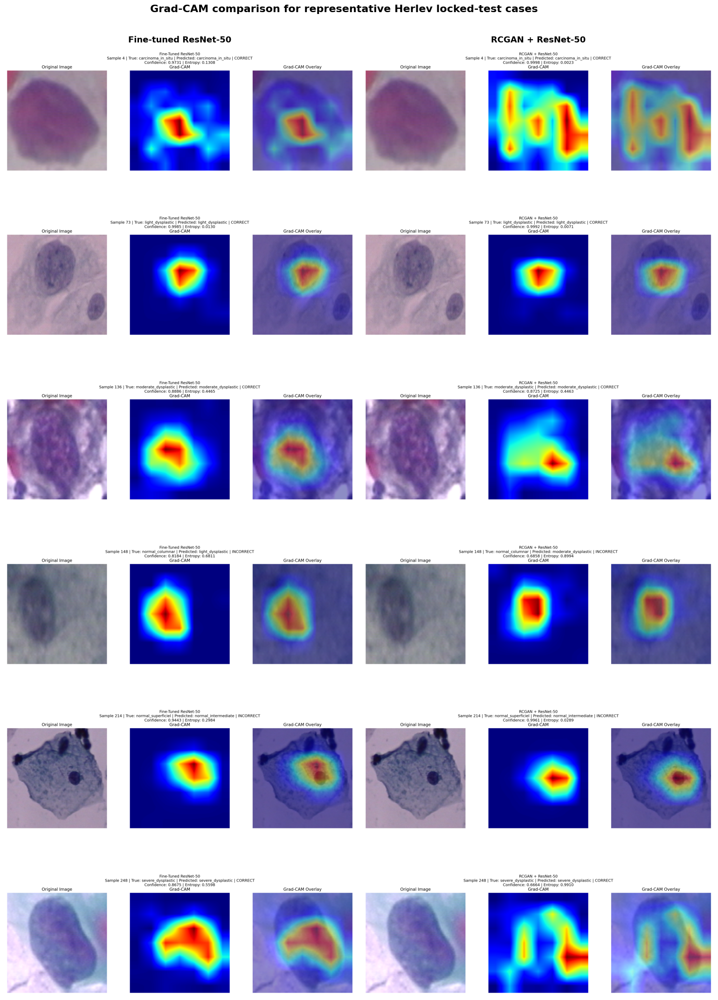


FIGURE 3 CREATION COMPLETE
Dataset       : Herlev
Cases         : 0004, 0073, 0136, 0148, 0214, 0248
Model pairs   : 6

PNG:
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/Final_Figures/Figure_3_Herlev_GradCAM_Comparison_FINAL_600dpi.png

TIFF:
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/Final_Figures/Figure_3_Herlev_GradCAM_Comparison_FINAL_600dpi.tif

✓ Figure 3 was constructed directly from the existing Grad-CAM result files.


In [ ]:
# ============================================================
# FIGURE 3 — HERLEV PAIRED GRAD-CAM COMPARISON
# FINAL PUBLICATION FIGURE
# ============================================================

from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# ============================================================
# 1. PATHS
# ============================================================

PROJECT_ROOT = Path(
    "/content/drive/MyDrive/Cervix_frontiers"
)

BASE_DIR = (
    PROJECT_ROOT /
    "07_Results" /
    "Herlev_Comparative_Analysis" /
    "GradCAM_Comparison"
)

BASELINE_DIR = (
    BASE_DIR /
    "Fine-Tuned_ResNet-50"
)

RCGAN_DIR = (
    BASE_DIR /
    "RCGAN_plus_ResNet-50"
)

OUTPUT_DIR = (
    PROJECT_ROOT /
    "07_Results" /
    "Herlev_Comparative_Analysis" /
    "Final_Figures"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ============================================================
# 2. SELECTED REPRESENTATIVE CASES
# ============================================================

selected_cases = [
    "0004",
    "0073",
    "0136",
    "0148",
    "0214",
    "0248"
]


# ============================================================
# 3. VERIFY SOURCE FILES
# ============================================================

print("=" * 100)
print("FIGURE 3 — HERLEV PAIRED GRAD-CAM COMPARISON")
print("=" * 100)

source_pairs = []

for case_id in selected_cases:

    baseline_path = (
        BASELINE_DIR /
        f"sample_{case_id}_gradcam.png"
    )

    rcgan_path = (
        RCGAN_DIR /
        f"sample_{case_id}_gradcam.png"
    )

    if not baseline_path.exists():
        raise FileNotFoundError(
            f"Missing baseline file:\n{baseline_path}"
        )

    if not rcgan_path.exists():
        raise FileNotFoundError(
            f"Missing RCGAN file:\n{rcgan_path}"
        )

    source_pairs.append(
        (case_id, baseline_path, rcgan_path)
    )

    print(
        f"✓ Case {case_id}: "
        f"baseline + RCGAN found"
    )


# ============================================================
# 4. LOAD AND VERIFY IMAGE DIMENSIONS
# ============================================================

print("\n" + "-" * 100)
print("IMAGE DIMENSION VERIFICATION")
print("-" * 100)

for case_id, baseline_path, rcgan_path in source_pairs:

    baseline_img = Image.open(
        baseline_path
    )

    rcgan_img = Image.open(
        rcgan_path
    )

    print(
        f"Case {case_id}: "
        f"Baseline {baseline_img.size} | "
        f"RCGAN {rcgan_img.size}"
    )


# ============================================================
# 5. CREATE FIGURE
#
# Each source image already contains:
# Original image + model Grad-CAM + model Overlay
#
# We therefore display the existing outputs directly.
# ============================================================

fig, axes = plt.subplots(
    nrows=len(selected_cases),
    ncols=2,
    figsize=(16, 22)
)


# ============================================================
# 6. DISPLAY EACH PAIRED CASE
# ============================================================

for row, (
    case_id,
    baseline_path,
    rcgan_path
) in enumerate(source_pairs):

    baseline_img = Image.open(
        baseline_path
    ).convert("RGB")

    rcgan_img = Image.open(
        rcgan_path
    ).convert("RGB")

    # Baseline
    axes[row, 0].imshow(
        baseline_img
    )

    # RCGAN
    axes[row, 1].imshow(
        rcgan_img
    )

    # Case identifier
    axes[row, 0].set_ylabel(
        f"Case {case_id}",
        fontsize=11,
        fontweight="bold",
        rotation=90,
        labelpad=15
    )

    # Remove axes
    axes[row, 0].axis("off")
    axes[row, 1].axis("off")


# ============================================================
# 7. COLUMN HEADINGS
# ============================================================

axes[0, 0].set_title(
    "Fine-tuned ResNet-50",
    fontsize=13,
    fontweight="bold",
    pad=12
)

axes[0, 1].set_title(
    "RCGAN + ResNet-50",
    fontsize=13,
    fontweight="bold",
    pad=12
)


# ============================================================
# 8. FIGURE TITLE
# ============================================================

fig.suptitle(
    "Grad-CAM comparison for representative Herlev locked-test cases",
    fontsize=16,
    fontweight="bold",
    y=0.995
)


# ============================================================
# 9. LAYOUT
# ============================================================

plt.subplots_adjust(
    left=0.045,
    right=0.995,
    top=0.965,
    bottom=0.015,
    wspace=0.025,
    hspace=0.08
)


# ============================================================
# 10. SAVE PUBLICATION FILES
# ============================================================

png_path = (
    OUTPUT_DIR /
    "Figure_3_Herlev_GradCAM_Comparison_FINAL_600dpi.png"
)

tif_path = (
    OUTPUT_DIR /
    "Figure_3_Herlev_GradCAM_Comparison_FINAL_600dpi.tif"
)

fig.savefig(
    png_path,
    dpi=600,
    bbox_inches="tight"
)

fig.savefig(
    tif_path,
    dpi=600,
    bbox_inches="tight"
)


# ============================================================
# 11. DISPLAY
# ============================================================

plt.show()

plt.close(fig)


# ============================================================
# 12. FINAL VERIFICATION
# ============================================================

print("\n" + "=" * 100)
print("FIGURE 3 CREATION COMPLETE")
print("=" * 100)

print(
    "Dataset       : Herlev"
)

print(
    "Cases         :",
    ", ".join(selected_cases)
)

print(
    "Model pairs   :",
    len(source_pairs)
)

print(
    "\nPNG:"
)

print(png_path)

print(
    "\nTIFF:"
)

print(tif_path)

print(
    "\n✓ Figure 3 was constructed directly from "
    "the existing Grad-CAM result files."
)

FIGURE 3 — HERLEV GRAD-CAM COMPARISON

Selected cases:
0004, 0073, 0136, 0148, 0214, 0248
✓ Case 0004: baseline + RCGAN verified
✓ Case 0073: baseline + RCGAN verified
✓ Case 0136: baseline + RCGAN verified
✓ Case 0148: baseline + RCGAN verified
✓ Case 0214: baseline + RCGAN verified
✓ Case 0248: baseline + RCGAN verified

--------------------------------------------------------------------------------------------------------------
SOURCE IMAGE STRUCTURE
--------------------------------------------------------------------------------------------------------------
Source image: sample_0004_gradcam.png
Dimensions: (2824, 990)
✓ Existing three-panel Grad-CAM output detected.


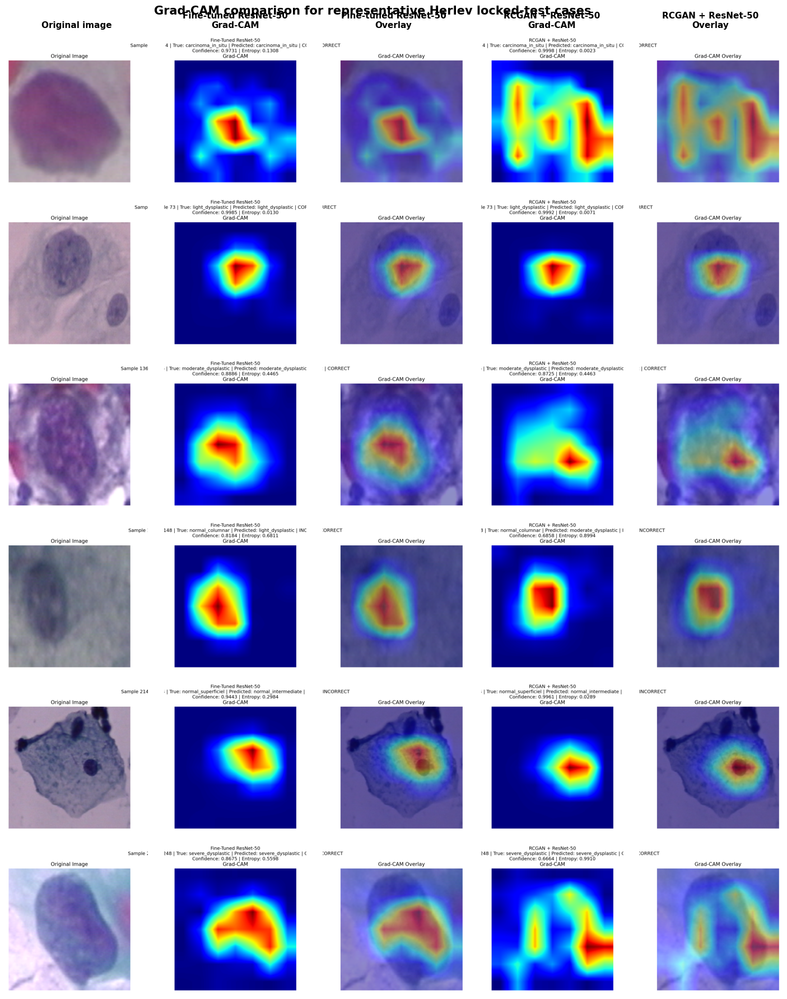


FIGURE 3 FINAL VERSION CREATED
Dataset       : Herlev
Cases         : 0004, 0073, 0136, 0148, 0214, 0248
Rows          : 6
Columns       : 5
Resolution    : 600 DPI

PNG:
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/Final_Figures/Figure_3_Herlev_GradCAM_Comparison_FINAL_600dpi.png

TIFF:
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_Comparative_Analysis/Final_Figures/Figure_3_Herlev_GradCAM_Comparison_FINAL_600dpi.tif

✓ Figure 3 constructed directly from existing experimental Grad-CAM outputs.
✓ No model retraining.
✓ No new Grad-CAM generation.
✓ Original generated annotations preserved.


In [ ]:
# ============================================================
# FIGURE 3 — HERLEV GRAD-CAM COMPARISON
# FINAL 5-COLUMN PUBLICATION VERSION
# ============================================================

from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# ============================================================
# 1. PATHS
# ============================================================

PROJECT_ROOT = Path(
    "/content/drive/MyDrive/Cervix_frontiers"
)

BASE_DIR = (
    PROJECT_ROOT /
    "07_Results" /
    "Herlev_Comparative_Analysis" /
    "GradCAM_Comparison"
)

BASELINE_DIR = (
    BASE_DIR /
    "Fine-Tuned_ResNet-50"
)

RCGAN_DIR = (
    BASE_DIR /
    "RCGAN_plus_ResNet-50"
)

OUTPUT_DIR = (
    PROJECT_ROOT /
    "07_Results" /
    "Herlev_Comparative_Analysis" /
    "Final_Figures"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ============================================================
# 2. SELECTED CASES
# ============================================================

selected_cases = [
    "0004",
    "0073",
    "0136",
    "0148",
    "0214",
    "0248"
]

print("=" * 110)
print("FIGURE 3 — HERLEV GRAD-CAM COMPARISON")
print("=" * 110)

print("\nSelected cases:")
print(", ".join(selected_cases))


# ============================================================
# 3. SOURCE FILE VERIFICATION
# ============================================================

source_data = []

for case_id in selected_cases:

    baseline_path = (
        BASELINE_DIR /
        f"sample_{case_id}_gradcam.png"
    )

    rcgan_path = (
        RCGAN_DIR /
        f"sample_{case_id}_gradcam.png"
    )

    if not baseline_path.exists():
        raise FileNotFoundError(
            f"Baseline Grad-CAM file missing:\n{baseline_path}"
        )

    if not rcgan_path.exists():
        raise FileNotFoundError(
            f"RCGAN Grad-CAM file missing:\n{rcgan_path}"
        )

    source_data.append(
        (
            case_id,
            baseline_path,
            rcgan_path
        )
    )

    print(
        f"✓ Case {case_id}: "
        f"baseline + RCGAN verified"
    )


# ============================================================
# 4. FUNCTION TO SPLIT EXISTING GRAD-CAM OUTPUT
#
# Existing image structure:
#
#     Original | Grad-CAM | Grad-CAM Overlay
#
# We preserve the original generated content.
# ============================================================

def split_gradcam_image(path):

    img = Image.open(path).convert("RGB")

    width, height = img.size

    # Three horizontal panels.
    x1 = 0
    x2 = width // 3
    x3 = (2 * width) // 3
    x4 = width

    original = img.crop(
        (x1, 0, x2, height)
    )

    gradcam = img.crop(
        (x2, 0, x3, height)
    )

    overlay = img.crop(
        (x3, 0, x4, height)
    )

    return (
        np.asarray(original),
        np.asarray(gradcam),
        np.asarray(overlay)
    )


# ============================================================
# 5. VERIFY SOURCE IMAGE STRUCTURE
# ============================================================

print("\n" + "-" * 110)
print("SOURCE IMAGE STRUCTURE")
print("-" * 110)

test_case = selected_cases[0]

test_path = (
    BASELINE_DIR /
    f"sample_{test_case}_gradcam.png"
)

test_img = Image.open(
    test_path
)

print(
    f"Source image: {test_path.name}"
)

print(
    f"Dimensions: {test_img.size}"
)

if test_img.size[0] < 3:
    raise ValueError(
        "Unexpected Grad-CAM source image width."
    )

print(
    "✓ Existing three-panel Grad-CAM output detected."
)


# ============================================================
# 6. CREATE 5-COLUMN FIGURE
# ============================================================

fig, axes = plt.subplots(
    nrows=len(selected_cases),
    ncols=5,
    figsize=(15, 18)
)


# ============================================================
# 7. COLUMN HEADINGS
# ============================================================

column_titles = [
    "Original image",
    "Fine-tuned ResNet-50\nGrad-CAM",
    "Fine-tuned ResNet-50\nOverlay",
    "RCGAN + ResNet-50\nGrad-CAM",
    "RCGAN + ResNet-50\nOverlay"
]


for col, title in enumerate(column_titles):

    axes[0, col].set_title(
        title,
        fontsize=11,
        fontweight="bold",
        pad=10
    )


# ============================================================
# 8. BUILD EACH ROW
# ============================================================

for row, (
    case_id,
    baseline_path,
    rcgan_path
) in enumerate(source_data):

    # --------------------------------------------------------
    # Baseline panels
    # --------------------------------------------------------

    (
        baseline_original,
        baseline_gradcam,
        baseline_overlay
    ) = split_gradcam_image(
        baseline_path
    )

    # --------------------------------------------------------
    # RCGAN panels
    # --------------------------------------------------------

    (
        rcgan_original,
        rcgan_gradcam,
        rcgan_overlay
    ) = split_gradcam_image(
        rcgan_path
    )

    # --------------------------------------------------------
    # Five-column arrangement
    # --------------------------------------------------------

    axes[row, 0].imshow(
        baseline_original
    )

    axes[row, 1].imshow(
        baseline_gradcam
    )

    axes[row, 2].imshow(
        baseline_overlay
    )

    axes[row, 3].imshow(
        rcgan_gradcam
    )

    axes[row, 4].imshow(
        rcgan_overlay
    )

    # --------------------------------------------------------
    # Case label
    # --------------------------------------------------------

    axes[row, 0].set_ylabel(
        f"Case {case_id}",
        fontsize=10,
        fontweight="bold",
        rotation=90,
        labelpad=12
    )

    # --------------------------------------------------------
    # Remove axes
    # --------------------------------------------------------

    for col in range(5):

        axes[row, col].axis("off")


# ============================================================
# 9. FIGURE TITLE
# ============================================================

fig.suptitle(
    "Grad-CAM comparison for representative Herlev locked-test cases",
    fontsize=15,
    fontweight="bold",
    y=0.995
)


# ============================================================
# 10. LAYOUT
# ============================================================

plt.subplots_adjust(
    left=0.055,
    right=0.995,
    top=0.965,
    bottom=0.015,
    wspace=0.015,
    hspace=0.08
)


# ============================================================
# 11. SAVE FINAL FIGURE
# ============================================================

png_path = (
    OUTPUT_DIR /
    "Figure_3_Herlev_GradCAM_Comparison_FINAL_600dpi.png"
)

tif_path = (
    OUTPUT_DIR /
    "Figure_3_Herlev_GradCAM_Comparison_FINAL_600dpi.tif"
)

fig.savefig(
    png_path,
    dpi=600,
    bbox_inches="tight"
)

fig.savefig(
    tif_path,
    dpi=600,
    bbox_inches="tight"
)


# ============================================================
# 12. DISPLAY
# ============================================================

plt.show()

plt.close(fig)


# ============================================================
# 13. FINAL VERIFICATION
# ============================================================

print("\n" + "=" * 110)
print("FIGURE 3 FINAL VERSION CREATED")
print("=" * 110)

print("Dataset       : Herlev")
print("Cases         :", ", ".join(selected_cases))
print("Rows          :", len(selected_cases))
print("Columns       : 5")
print("Resolution    : 600 DPI")

print("\nPNG:")
print(png_path)

print("\nTIFF:")
print(tif_path)

print(
    "\n✓ Figure 3 constructed directly from "
    "existing experimental Grad-CAM outputs."
)

print(
    "✓ No model retraining."
)

print(
    "✓ No new Grad-CAM generation."
)

print(
    "✓ Original generated annotations preserved."
)

print("=" * 110)

SUPPLEMENTARY FIGURE S5 — SOURCE FILE VERIFICATION

Herlev baseline:
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_ResNet50_FineTuned/Locked_Test_Evaluation/finetuned_resnet50_locked_test_predictions.csv
Exists: True

Herlev RCGAN:
/content/drive/MyDrive/Cervix_frontiers/07_Results/Herlev_RCGAN_ResNet50/Locked_Test_Evaluation/rcgan_resnet50_locked_test_predictions.csv
Exists: True

SIPaKMeD baseline:
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Tables/sipakmed_baseline_confusion_matrix.csv
Exists: True

SIPaKMeD RCGAN:
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Tables/sipakmed_rcgan_confusion_matrix.csv
Exists: True

✓ All four source artifacts found

HERLEV BASELINE — CORRECT MACRO-F1 CHECKPOINT
Rows: 274

Columns:
['image_path', 'true_class_id', 'true_class', 'predicted_class_id', 'predicted_class', 'correct', 'confidence']

Herlev class mapping:
 true_class_id          true_class
             0   c

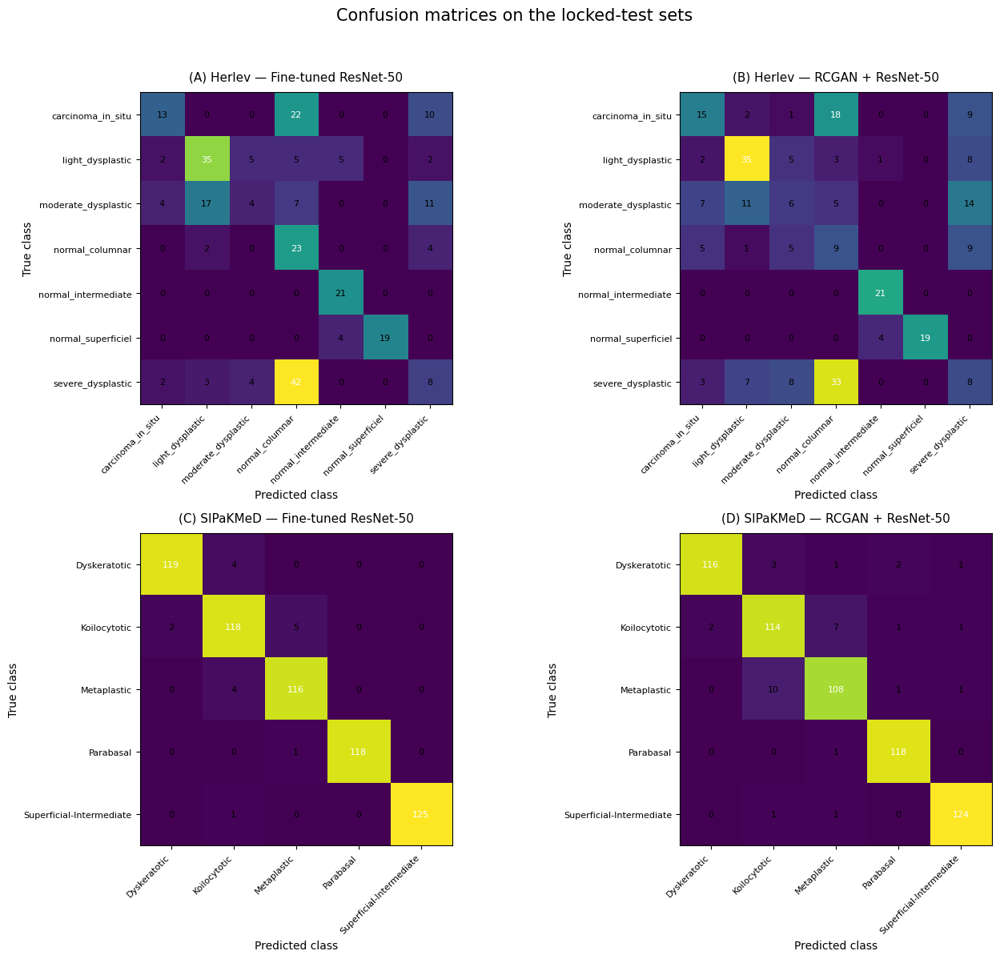


S5 FINAL VERIFICATION
Herlev baseline  : 123/274 = 44.89%
Herlev RCGAN     : 113/274 = 41.24%
SIPaKMeD baseline: 596/613 = 97.23%
SIPaKMeD RCGAN   : 580/613 = 94.62%

PNG:
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S5_Locked_Test_Confusion_Matrices_FINAL_600dpi.png

TIFF:
/content/drive/MyDrive/Cervix_frontiers/07_Results/SIPaKMeD_Comparative_Analysis/Final_Explainability_Uncertainty/Figures/Supplementary_Figure_S5_Locked_Test_Confusion_Matrices_FINAL_600dpi.tif

✓ SUPPLEMENTARY FIGURE S5 COMPLETED
✓ Herlev baseline uses the corrected 44.89% checkpoint
✓ No retraining performed
✓ No checkpoint modified
✓ All four confusion matrices verified


In [2]:
# =============================================================================
# SUPPLEMENTARY FIGURE S5
# FINAL LOCKED-TEST CONFUSION MATRICES
#
# Four experimental conditions:
#
# (A) Herlev — Fine-tuned ResNet-50
# (B) Herlev — RCGAN + ResNet-50
# (C) SIPaKMeD — Fine-tuned ResNet-50
# (D) SIPaKMeD — RCGAN + ResNet-50
#
# IMPORTANT:
# Herlev baseline MUST use the corrected prediction file generated from:
#
#     resnet50_finetuned_best_macro_f1.pth
#
# This checkpoint produced:
#
#     123 / 274 = 44.89%
#
# No model is retrained in this cell.
# =============================================================================


from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix


# =============================================================================
# 1. ROOT DIRECTORY
# =============================================================================

ROOT = Path(
    "/content/drive/MyDrive/Cervix_frontiers/07_Results"
)


OUTPUT_DIR = (
    ROOT
    / "SIPaKMeD_Comparative_Analysis"
    / "Final_Explainability_Uncertainty"
    / "Figures"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# =============================================================================
# 2. SOURCE FILES
# =============================================================================

# -------------------------------------------------------------------------
# HERLEV BASELINE
# Correct Macro-F1 checkpoint
# -------------------------------------------------------------------------

HERLEV_BASELINE_FILE = (
    ROOT
    / "Herlev_ResNet50_FineTuned"
    / "Locked_Test_Evaluation"
    / "finetuned_resnet50_locked_test_predictions.csv"
)


# -------------------------------------------------------------------------
# HERLEV RCGAN
# -------------------------------------------------------------------------

HERLEV_RCGAN_FILE = (
    ROOT
    / "Herlev_RCGAN_ResNet50"
    / "Locked_Test_Evaluation"
    / "rcgan_resnet50_locked_test_predictions.csv"
)


# -------------------------------------------------------------------------
# SIPAKMED BASELINE
# -------------------------------------------------------------------------

SIPAKMED_BASELINE_FILE = (
    ROOT
    / "SIPaKMeD_Comparative_Analysis"
    / "Tables"
    / "sipakmed_baseline_confusion_matrix.csv"
)


# -------------------------------------------------------------------------
# SIPAKMED RCGAN
# -------------------------------------------------------------------------

SIPAKMED_RCGAN_FILE = (
    ROOT
    / "SIPaKMeD_Comparative_Analysis"
    / "Tables"
    / "sipakmed_rcgan_confusion_matrix.csv"
)


# =============================================================================
# 3. VERIFY ALL SOURCE FILES
# =============================================================================

print("=" * 100)
print("SUPPLEMENTARY FIGURE S5 — SOURCE FILE VERIFICATION")
print("=" * 100)


source_files = {
    "Herlev baseline": HERLEV_BASELINE_FILE,
    "Herlev RCGAN": HERLEV_RCGAN_FILE,
    "SIPaKMeD baseline": SIPAKMED_BASELINE_FILE,
    "SIPaKMeD RCGAN": SIPAKMED_RCGAN_FILE,
}


for name, path in source_files.items():

    print(f"\n{name}:")
    print(path)
    print("Exists:", path.exists())

    if not path.exists():

        raise FileNotFoundError(
            f"\nSTOP.\n"
            f"Required source file was not found:\n{path}"
        )


print("\n✓ All four source artifacts found")


# =============================================================================
# 4. LOAD HERLEV BASELINE
# =============================================================================

hb = pd.read_csv(
    HERLEV_BASELINE_FILE
)


print("\n" + "=" * 100)
print("HERLEV BASELINE — CORRECT MACRO-F1 CHECKPOINT")
print("=" * 100)


print(
    "Rows:",
    len(hb)
)


print(
    "\nColumns:"
)

print(
    hb.columns.tolist()
)


# =============================================================================
# 5. VERIFY HERLEV BASELINE
# =============================================================================

required_baseline_columns = [
    "true_class_id",
    "true_class",
    "predicted_class_id",
    "predicted_class",
]


for column in required_baseline_columns:

    if column not in hb.columns:

        raise RuntimeError(
            f"STOP: Required column missing from Herlev baseline: "
            f"{column}"
        )


if len(hb) != 274:

    raise RuntimeError(
        f"STOP: Expected 274 Herlev baseline predictions, "
        f"found {len(hb)}."
    )


# =============================================================================
# 6. HERLEV BASELINE CLASS MAPPING
# =============================================================================

herlev_mapping = (
    hb[
        [
            "true_class_id",
            "true_class"
        ]
    ]
    .drop_duplicates()
    .sort_values("true_class_id")
)


herlev_ids = (
    herlev_mapping[
        "true_class_id"
    ]
    .astype(int)
    .tolist()
)


herlev_labels = (
    herlev_mapping[
        "true_class"
    ]
    .astype(str)
    .tolist()
)


print("\nHerlev class mapping:")

print(
    herlev_mapping.to_string(
        index=False
    )
)


print(
    "\nClass IDs:",
    herlev_ids
)


print(
    "Class labels:",
    herlev_labels
)


if len(herlev_labels) != 7:

    raise RuntimeError(
        "STOP: Herlev baseline does not contain exactly 7 classes."
    )


# =============================================================================
# 7. HERLEV BASELINE ACCURACY VERIFICATION
# =============================================================================

baseline_correct = (
    hb["true_class_id"].astype(int)
    ==
    hb["predicted_class_id"].astype(int)
)


baseline_correct_count = int(
    baseline_correct.sum()
)


baseline_accuracy = (
    baseline_correct_count
    /
    len(hb)
)


print(
    "\n" + "=" * 100
)

print(
    "HERLEV BASELINE FINAL VERIFICATION"
)

print(
    "=" * 100
)


print(
    f"Correct predictions : "
    f"{baseline_correct_count}/274"
)


print(
    f"Accuracy            : "
    f"{baseline_accuracy:.4f} "
    f"({baseline_accuracy * 100:.2f}%)"
)


# Critical checkpoint verification

if baseline_correct_count != 123:

    raise RuntimeError(
        "\nSTOP.\n"
        "The Herlev baseline CSV is not the corrected "
        "Macro-F1 checkpoint prediction file.\n\n"
        f"Found: {baseline_correct_count}/274 "
        f"({baseline_accuracy * 100:.2f}%)\n"
        "Expected: 123/274 (44.89%)."
    )


print(
    "\n✓ CORRECT HERLEV BASELINE CONFIRMED"
)

print(
    "✓ 123/274 = 44.89%"
)


# =============================================================================
# 8. HERLEV BASELINE CONFUSION MATRIX
# =============================================================================

cm_hb = confusion_matrix(
    hb["true_class"],
    hb["predicted_class"],
    labels=herlev_labels
)


print(
    "\nHerlev baseline confusion matrix:"
)

print(
    cm_hb
)


if cm_hb.shape != (7, 7):

    raise RuntimeError(
        f"STOP: Expected 7 × 7 Herlev baseline matrix, "
        f"found {cm_hb.shape}."
    )


if cm_hb.sum() != 274:

    raise RuntimeError(
        "STOP: Herlev baseline matrix does not sum to 274."
    )


if np.trace(cm_hb) != 123:

    raise RuntimeError(
        "STOP: Herlev baseline matrix diagonal does not equal 123."
    )


print(
    "\n✓ Herlev baseline matrix verified"
)


# =============================================================================
# 9. LOAD HERLEV RCGAN
# =============================================================================

hr = pd.read_csv(
    HERLEV_RCGAN_FILE
)


print(
    "\n" + "=" * 100
)

print(
    "HERLEV RCGAN VERIFICATION"
)

print(
    "=" * 100
)


print(
    "Rows:",
    len(hr)
)


print(
    "\nColumns:"
)

print(
    hr.columns.tolist()
)


# =============================================================================
# 10. VERIFY HERLEV RCGAN REQUIRED COLUMNS
#
# The RCGAN prediction file does not contain class-ID columns.
# Therefore we use the textual class columns directly.
# =============================================================================

required_rcgan_columns = [
    "true_class",
    "predicted_class"
]


for column in required_rcgan_columns:

    if column not in hr.columns:

        raise RuntimeError(
            f"STOP: Required column missing from Herlev RCGAN file: "
            f"{column}"
        )


if len(hr) != 274:

    raise RuntimeError(
        f"STOP: Expected 274 Herlev RCGAN predictions, "
        f"found {len(hr)}."
    )


# =============================================================================
# 11. HERLEV RCGAN CLASS LABELS
# =============================================================================

rcgan_true_labels = (
    hr["true_class"]
    .astype(str)
    .unique()
    .tolist()
)


rcgan_pred_labels = (
    hr["predicted_class"]
    .astype(str)
    .unique()
    .tolist()
)


all_rcgan_labels = sorted(
    set(rcgan_true_labels)
    |
    set(rcgan_pred_labels)
)


print(
    "\nHerlev RCGAN classes found:"
)

for label in all_rcgan_labels:

    print(
        " -",
        label
    )


# =============================================================================
# 12. VERIFY HERLEV RCGAN CLASS SET
#
# Use the baseline class order as the authoritative order.
# =============================================================================

missing_labels = (
    set(herlev_labels)
    -
    set(all_rcgan_labels)
)


unexpected_labels = (
    set(all_rcgan_labels)
    -
    set(herlev_labels)
)


if missing_labels:

    raise RuntimeError(
        "\nSTOP: Herlev RCGAN prediction file is missing "
        f"expected classes:\n{sorted(missing_labels)}"
    )


if unexpected_labels:

    raise RuntimeError(
        "\nSTOP: Herlev RCGAN prediction file contains "
        f"unexpected classes:\n{sorted(unexpected_labels)}"
    )


print(
    "\n✓ Herlev RCGAN class labels match baseline class set"
)


# =============================================================================
# 13. HERLEV RCGAN ACCURACY VERIFICATION
# =============================================================================

rcgan_correct = (
    hr["true_class"].astype(str)
    ==
    hr["predicted_class"].astype(str)
)


rcgan_correct_count = int(
    rcgan_correct.sum()
)


rcgan_accuracy = (
    rcgan_correct_count
    /
    len(hr)
)


print(
    "\nHerlev RCGAN correct predictions:",
    f"{rcgan_correct_count}/274"
)


print(
    "Herlev RCGAN accuracy:",
    f"{rcgan_accuracy:.4f} "
    f"({rcgan_accuracy * 100:.2f}%)"
)


# Critical verification

if rcgan_correct_count != 113:

    raise RuntimeError(
        "\nSTOP.\n"
        "Herlev RCGAN prediction file does not reproduce "
        "the verified 41.24% result.\n\n"
        f"Found: {rcgan_correct_count}/274 "
        f"({rcgan_accuracy * 100:.2f}%)\n"
        "Expected: 113/274 (41.24%)."
    )


print(
    "\n✓ Herlev RCGAN confirmed"
)

print(
    "✓ 113/274 = 41.24%"
)


# =============================================================================
# 14. HERLEV RCGAN CONFUSION MATRIX
# =============================================================================

cm_hr = confusion_matrix(
    hr["true_class"],
    hr["predicted_class"],
    labels=herlev_labels
)


print(
    "\nHerlev RCGAN confusion matrix:"
)

print(
    cm_hr
)


if cm_hr.shape != (7, 7):

    raise RuntimeError(
        f"STOP: Expected 7 × 7 Herlev RCGAN matrix, "
        f"found {cm_hr.shape}."
    )


if cm_hr.sum() != 274:

    raise RuntimeError(
        "STOP: Herlev RCGAN matrix does not sum to 274."
    )


if np.trace(cm_hr) != 113:

    raise RuntimeError(
        "STOP: Herlev RCGAN matrix diagonal does not equal 113."
    )


print(
    "\n✓ Herlev RCGAN matrix verified"
)


# =============================================================================
# 15. LOAD SIPAKMED MATRICES
# =============================================================================

sb_df = pd.read_csv(
    SIPAKMED_BASELINE_FILE
)


sr_df = pd.read_csv(
    SIPAKMED_RCGAN_FILE
)


# =============================================================================
# 16. FUNCTION TO EXTRACT SIPAKMED MATRIX
# =============================================================================

def extract_confusion_matrix(df):

    df = df.dropna(
        axis=1,
        how="all"
    )

    numeric = df.apply(
        pd.to_numeric,
        errors="coerce"
    )

    # First column contains row labels
    if numeric.iloc[:, 0].isna().all():

        labels = (
            df.iloc[:, 0]
            .astype(str)
            .tolist()
        )

        matrix = (
            numeric.iloc[:, 1:]
            .to_numpy()
        )

    else:

        labels = [
            str(c)
            for c in df.columns
        ]

        matrix = numeric.to_numpy()

    matrix = np.asarray(
        matrix,
        dtype=int
    )

    if matrix.shape[0] != matrix.shape[1]:

        raise RuntimeError(
            f"STOP: SIPaKMeD confusion matrix is not square: "
            f"{matrix.shape}"
        )

    return matrix, labels


# =============================================================================
# 17. SIPAKMED BASELINE
# =============================================================================

cm_sb, sip_labels_b = extract_confusion_matrix(
    sb_df
)


print(
    "\n" + "=" * 100
)

print(
    "SIPAKMED BASELINE VERIFICATION"
)

print(
    "=" * 100
)


print(
    "Matrix shape:",
    cm_sb.shape
)

print(
    "Total samples:",
    cm_sb.sum()
)

print(
    "Correct:",
    np.trace(cm_sb)
)

print(
    "Accuracy:",
    f"{np.trace(cm_sb) / cm_sb.sum() * 100:.2f}%"
)


if cm_sb.shape != (5, 5):

    raise RuntimeError(
        "STOP: SIPaKMeD baseline matrix must be 5 × 5."
    )


if cm_sb.sum() != 613:

    raise RuntimeError(
        "STOP: SIPaKMeD baseline matrix must contain 613 samples."
    )


if np.trace(cm_sb) != 596:

    raise RuntimeError(
        "STOP: SIPaKMeD baseline matrix must contain 596 correct predictions."
    )


print(
    "✓ SIPaKMeD baseline = 596/613 = 97.23%"
)


# =============================================================================
# 18. SIPAKMED RCGAN
# =============================================================================

cm_sr, sip_labels_r = extract_confusion_matrix(
    sr_df
)


print(
    "\n" + "=" * 100
)

print(
    "SIPAKMED RCGAN VERIFICATION"
)

print(
    "=" * 100
)


print(
    "Matrix shape:",
    cm_sr.shape
)

print(
    "Total samples:",
    cm_sr.sum()
)

print(
    "Correct:",
    np.trace(cm_sr)
)

print(
    "Accuracy:",
    f"{np.trace(cm_sr) / cm_sr.sum() * 100:.2f}%"
)


if cm_sr.shape != (5, 5):

    raise RuntimeError(
        "STOP: SIPaKMeD RCGAN matrix must be 5 × 5."
    )


if cm_sr.sum() != 613:

    raise RuntimeError(
        "STOP: SIPaKMeD RCGAN matrix must contain 613 samples."
    )


if np.trace(cm_sr) != 580:

    raise RuntimeError(
        "STOP: SIPaKMeD RCGAN matrix must contain 580 correct predictions."
    )


print(
    "✓ SIPaKMeD RCGAN = 580/613 = 94.62%"
)


# =============================================================================
# 19. FINAL MATRIX DATA
# =============================================================================

matrix_data = [

    (
        cm_hb,
        herlev_labels,
        "(A) Herlev — Fine-tuned ResNet-50"
    ),

    (
        cm_hr,
        herlev_labels,
        "(B) Herlev — RCGAN + ResNet-50"
    ),

    (
        cm_sb,
        sip_labels_b,
        "(C) SIPaKMeD — Fine-tuned ResNet-50"
    ),

    (
        cm_sr,
        sip_labels_r,
        "(D) SIPaKMeD — RCGAN + ResNet-50"
    )

]


# =============================================================================
# 20. CREATE FIGURE
# =============================================================================

print(
    "\n" + "=" * 100
)

print(
    "GENERATING FINAL SUPPLEMENTARY FIGURE S5"
)

print(
    "=" * 100
)


fig, axes = plt.subplots(
    2,
    2,
    figsize=(14, 12)
)


axes = axes.flatten()


for ax, (
    matrix,
    labels,
    title
) in zip(
    axes,
    matrix_data
):

    im = ax.imshow(
        matrix
    )

    n = len(labels)

    ax.set_xticks(
        np.arange(n)
    )

    ax.set_yticks(
        np.arange(n)
    )

    ax.set_xticklabels(
        labels,
        rotation=45,
        ha="right",
        fontsize=8
    )

    ax.set_yticklabels(
        labels,
        fontsize=8
    )

    ax.set_xlabel(
        "Predicted class",
        fontsize=10
    )

    ax.set_ylabel(
        "True class",
        fontsize=10
    )

    ax.set_title(
        title,
        fontsize=11,
        pad=10
    )


    # -------------------------------------------------------------
    # Count annotations
    # -------------------------------------------------------------

    max_value = matrix.max()


    for i in range(n):

        for j in range(n):

            value = matrix[i, j]

            text_color = (
                "white"
                if value > max_value * 0.5
                else "black"
            )


            ax.text(
                j,
                i,
                str(value),
                ha="center",
                va="center",
                fontsize=8,
                color=text_color
            )


# =============================================================================
# 21. SHARED TITLE
# =============================================================================

fig.suptitle(
    "Confusion matrices on the locked-test sets",
    fontsize=15,
    y=0.995
)


plt.tight_layout(
    rect=[
        0,
        0,
        1,
        0.97
    ]
)


# =============================================================================
# 22. SAVE FINAL FIGURE
# =============================================================================

PNG_PATH = (
    OUTPUT_DIR
    /
    "Supplementary_Figure_S5_Locked_Test_"
    "Confusion_Matrices_FINAL_600dpi.png"
)


TIFF_PATH = (
    OUTPUT_DIR
    /
    "Supplementary_Figure_S5_Locked_Test_"
    "Confusion_Matrices_FINAL_600dpi.tif"
)


fig.savefig(
    PNG_PATH,
    dpi=600,
    bbox_inches="tight"
)


fig.savefig(
    TIFF_PATH,
    dpi=600,
    bbox_inches="tight"
)


plt.show()

plt.close(fig)


# =============================================================================
# 23. FINAL VERIFICATION
# =============================================================================

print(
    "\n" + "=" * 100
)

print(
    "S5 FINAL VERIFICATION"
)

print(
    "=" * 100
)


print(
    f"Herlev baseline  : "
    f"{np.trace(cm_hb)}/{cm_hb.sum()} = "
    f"{np.trace(cm_hb) / cm_hb.sum() * 100:.2f}%"
)


print(
    f"Herlev RCGAN     : "
    f"{np.trace(cm_hr)}/{cm_hr.sum()} = "
    f"{np.trace(cm_hr) / cm_hr.sum() * 100:.2f}%"
)


print(
    f"SIPaKMeD baseline: "
    f"{np.trace(cm_sb)}/{cm_sb.sum()} = "
    f"{np.trace(cm_sb) / cm_sb.sum() * 100:.2f}%"
)


print(
    f"SIPaKMeD RCGAN   : "
    f"{np.trace(cm_sr)}/{cm_sr.sum()} = "
    f"{np.trace(cm_sr) / cm_sr.sum() * 100:.2f}%"
)


print(
    "\nPNG:"
)

print(
    PNG_PATH
)


print(
    "\nTIFF:"
)

print(
    TIFF_PATH
)


print(
    "\n" + "=" * 100
)

print(
    "✓ SUPPLEMENTARY FIGURE S5 COMPLETED"
)

print(
    "✓ Herlev baseline uses the corrected 44.89% checkpoint"
)

print(
    "✓ No retraining performed"
)

print(
    "✓ No checkpoint modified"
)

print(
    "✓ All four confusion matrices verified"
)

print(
    "=" * 100
)